# Bengali Pitha Image Classification Using ConvNeXt-Tiny Deep Features

## Overview

Pitha are traditional Bengali rice-based cakes, and many varieties look very similar to one another, so recognizing them from photographs is a fine-grained image classification problem. This notebook implements a complete and reproducible classification pipeline for a curated dataset of Bengali pitha images (one folder per class). A frozen, ImageNet-pretrained **ConvNeXt-Tiny** network serves as a fixed feature extractor, the extracted features are compressed with **Principal Component Analysis (PCA)**, and four classical machine-learning classifiers are trained, compared and evaluated.

### Pipeline

1. **Stratified split** of the curated images into training, validation and test subsets (70 / 15 / 15).
2. **Augmentation of the training subset only**, performed after the split.
3. **Feature extraction** with a frozen ConvNeXt-Tiny backbone (global average pooling, 768-dimensional vectors).
4. **Dimensionality reduction** with PCA (256 components), fitted on training features only.
5. **Classifier training** of an SVM, Logistic Regression, Random Forest and XGBoost model.
6. **Model selection** based on validation accuracy.
7. **10-fold grouped cross-validation** on the training set to assess the stability of each classifier.
8. **Final evaluation** of the selected model on the held-out test set (metrics, confusion matrices, ROC curves) and **error analysis** of the misclassified images.

### Classifiers

| Classifier | Implementation | Key settings | Characteristics |
|---|---|---|---|
| SVM (RBF kernel) | `sklearn.svm.SVC` | `C=1.0`, `gamma=0.01`, probability estimates enabled | Kernel-based maximum-margin classifier, well suited to compact dense features |
| Logistic Regression | `sklearn.linear_model.LogisticRegression` | `max_iter=2000`, multinomial (softmax) formulation | Linear probabilistic baseline |
| Random Forest | `sklearn.ensemble.RandomForestClassifier` | 500 trees | Ensemble of bagged decision trees |
| XGBoost | `xgboost.XGBClassifier` | 500 boosting rounds, `multi:softprob` objective | Gradient-boosted decision trees |

### Evaluation Protocol

The following safeguards prevent information from the evaluation data from influencing training or model selection:

- **Split before augmentation.** No augmented copy of a validation or test image can appear in the training set.
- **PCA fitted on training data only.** Validation and test features are only transformed, never used to fit the projection.
- **Model selection on validation accuracy.** The test set is never consulted while choosing the classifier.
- **Single test evaluation.** The selected model is evaluated once on the untouched test set; this is the headline result.
- **Leakage-free cross-validation.** Original images and their augmented copies are kept in the same fold, PCA is refitted inside each fold, and only original images are scored.
- **Traceability.** Filenames are stored with every feature vector so each prediction can be traced back to the source image.

### Requirements

Python 3.10 or later and the following packages:

```
pip install tensorflow opencv-python scikit-learn xgboost joblib tqdm pillow matplotlib seaborn pandas
```

The notebook expects the following project layout. The notebook is intended to be executed with the project root as the working directory.

```
project/
├── pitha_convnext_pipeline.ipynb    this notebook
├── pitha_preprocessing.py           image loading, orientation correction, resize-with-padding
├── split_and_augment.py             stratified split and augmentation script
├── pitha_metadata.json              per-class metadata used in the inference demonstration
├── clean_data/<class_name>/*.jpg    curated dataset, one folder per class
├── split_data/                      generated: train / val / test folders and split manifest
└── model_convnext/                  generated: models, figures/ and tables/
```

### Outputs

Every figure and table is displayed **and** written to disk by the cell that produces it:

- `model_convnext/` holds the trained model, PCA transform, label encoder and extracted features.
- `model_convnext/figures/` holds all figures as PNG files (300 dpi).
- `model_convnext/tables/` holds all result tables as CSV files.

A complete list of generated files is given in Section 12.

## 1. Environment Setup

This section imports the required libraries, verifies that the installed TensorFlow build provides the ConvNeXt-Tiny architecture and its preprocessing function, and enables incremental GPU memory allocation when a GPU is available. Feature extraction with the frozen backbone also runs on a CPU, only more slowly.

In [1]:
import sys, os, json, math, time, random, platform, subprocess, warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import PIL
from IPython.display import display

# scikit-learn >= 1.9 emits a FutureWarning for SVC(probability=True). The option is still
# supported and is required here to obtain class-probability estimates (ROC-AUC, confidence).
warnings.filterwarnings('ignore', message='.*probability.*', category=FutureWarning)

import tensorflow as tf

# Enable incremental GPU memory allocation (if a GPU is present) instead of reserving all memory at start-up
gpus = tf.config.list_physical_devices('GPU')
for gpu in gpus:
    try:
        tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError:
        pass  # must be set before the GPU is initialized; safe to ignore if already done

# Verify that the required ConvNeXt-Tiny components exist in this TensorFlow build
if not hasattr(tf.keras.applications, 'ConvNeXtTiny'):
    raise RuntimeError(f'This TensorFlow build ({tf.__version__}) does not provide ConvNeXt-Tiny.')
if not hasattr(tf.keras.applications.convnext, 'preprocess_input'):
    raise RuntimeError('keras.applications.convnext.preprocess_input is not available.')

import sklearn
import joblib
import xgboost
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder, label_binarize
from sklearn.decomposition import PCA
from sklearn.metrics import (accuracy_score, precision_recall_fscore_support,
                             classification_report, confusion_matrix, cohen_kappa_score,
                             matthews_corrcoef, roc_auc_score, roc_curve, top_k_accuracy_score)

print(f'Python      : {sys.version.split()[0]}')
print(f'TensorFlow  : {tf.__version__}')
print(f'scikit-learn: {sklearn.__version__}')
print(f'XGBoost     : {xgboost.__version__}')
print(f'Device      : {"GPU" if gpus else "CPU (no GPU detected)"}')
print('ConvNeXt-Tiny and its preprocessing function are available.')

Python      : 3.11.9
TensorFlow  : 2.21.0
scikit-learn: 1.9.1
XGBoost     : 3.2.0
Device      : CPU (no GPU detected)
ConvNeXt-Tiny and its preprocessing function are available.


## 2. Configuration

All paths are defined relative to the project root, which is assumed to be the working directory of the notebook (the folder that contains `clean_data/`). If the notebook is stored elsewhere, set `BASE_DIR` explicitly. The cell below also creates the output folders:

- `model_convnext/` – trained models and intermediate artifacts
- `model_convnext/figures/` – figures (PNG), saved automatically whenever they are displayed
- `model_convnext/tables/` – result tables (CSV), saved automatically whenever they are displayed

All experiment settings are collected in this single cell so that every run is fully specified by it.

In [2]:
# ---------------------------------------------------------------- paths
BASE_DIR   = Path(r"D:\3-2\machine-learning-laboratory\project")   # project root (the folder that contains clean_data/); set manually if needed
SCRIPT_DIR = BASE_DIR     # folder containing pitha_preprocessing.py and split_and_augment.py

CURATED_DIR = BASE_DIR / 'clean_data'       # curated dataset: one sub-folder per class
SPLIT_DIR   = BASE_DIR / 'split_data'       # generated train / val / test folders
MODEL_DIR   = BASE_DIR / 'model_convnext'   # trained models and intermediate artifacts
FIG_DIR     = MODEL_DIR / 'figures'         # report figures (PNG)
TABLE_DIR   = MODEL_DIR / 'tables'          # report tables (CSV)

for folder in (MODEL_DIR, FIG_DIR, TABLE_DIR):
    folder.mkdir(parents=True, exist_ok=True)

# ---------------------------------------------------------------- experiment settings
TRAIN_RATIO, VAL_RATIO, TEST_RATIO = 0.70, 0.15, 0.15   # stratified split ratios
NUM_AUGMENTS   = 5      # augmented copies generated per training image
TARGET_SIZE    = 224    # backbone input resolution (pixels)
PCA_COMPONENTS = 256    # number of principal components retained
BATCH_SIZE     = 16     # images per batch during feature extraction
CV_FOLDS       = 10     # number of cross-validation folds
MISCLASSIFIED_PER_PAGE = 16   # images per figure in the misclassified-image gallery
FIG_DPI        = 300    # resolution of saved figures
SEED           = 42     # random seed used throughout

# ---------------------------------------------------------------- reproducibility
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# ---------------------------------------------------------------- display and plot style
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', 120)
sns.set_theme(style='whitegrid', context='notebook')
plt.rcParams.update({'savefig.dpi': FIG_DPI, 'savefig.bbox': 'tight', 'figure.dpi': 100})

# ---------------------------------------------------------------- sanity checks
if not CURATED_DIR.exists():
    raise FileNotFoundError(f'Dataset folder not found: {CURATED_DIR}. '
                            'Run the notebook from the project root or set BASE_DIR manually.')
for required_file in ('pitha_preprocessing.py', 'split_and_augment.py'):
    if not (SCRIPT_DIR / required_file).exists():
        raise FileNotFoundError(f'{required_file} not found in {SCRIPT_DIR}.')

# make pitha_preprocessing.py importable
if str(SCRIPT_DIR) not in sys.path:
    sys.path.insert(0, str(SCRIPT_DIR))

class_folders = sorted(d.name for d in CURATED_DIR.iterdir() if d.is_dir())
print(f'Project root : {BASE_DIR}')
print(f'Classes found: {len(class_folders)}')

Project root : D:\3-2\machine-learning-laboratory\project
Classes found: 24


The experimental setup and the software environment are recorded as tables so that they can be reported directly.

In [3]:
# ---------------------------------------------------------------- experimental setup table
setup_table = pd.DataFrame([
    ('Backbone',            'ConvNeXt-Tiny (ImageNet weights, frozen)',       'Fixed feature extractor, classification head removed'),
    ('Feature dimension',   '768',                                       'Global average pooling output'),
    ('Input size',          f'{TARGET_SIZE} x {TARGET_SIZE} px',          'Images are resized with padding'),
    ('Dimensionality reduction', f'PCA, {PCA_COMPONENTS} components',      'Fitted on training features only'),
    ('Data split (train/val/test)', f'{TRAIN_RATIO:.2f} / {VAL_RATIO:.2f} / {TEST_RATIO:.2f}', 'Stratified by class'),
    ('Augmentation',        f'{NUM_AUGMENTS} copies per training image',  'Training subset only, applied after the split'),
    ('Cross-validation',    f'{CV_FOLDS}-fold, grouped and stratified',   'Augmented copies stay in the fold of their original'),
    ('Batch size',          str(BATCH_SIZE),                              'Feature extraction'),
    ('Random seed',         str(SEED),                                    'Split, PCA, classifiers, cross-validation'),
], columns=['parameter', 'value', 'note'])

display(setup_table)
setup_table.to_csv(TABLE_DIR / 'experimental_setup.csv', index=False)

# ---------------------------------------------------------------- software environment table
environment_table = pd.DataFrame([
    ('Python',       sys.version.split()[0]),
    ('Platform',     platform.platform()),
    ('TensorFlow',   tf.__version__),
    ('NumPy',        np.__version__),
    ('pandas',       pd.__version__),
    ('scikit-learn', sklearn.__version__),
    ('XGBoost',      xgboost.__version__),
    ('Matplotlib',   matplotlib.__version__),
    ('seaborn',      sns.__version__),
    ('Pillow',       PIL.__version__),
    ('joblib',       joblib.__version__),
    ('Compute device', 'GPU' if gpus else 'CPU'),
], columns=['component', 'version'])

display(environment_table)
environment_table.to_csv(TABLE_DIR / 'software_environment.csv', index=False)

,parameter,value,note
0,Backbone,"ConvNeXt-Tiny (ImageNet weights, frozen)","Fixed feature extractor, classification head removed"
1,Feature dimension,768,Global average pooling output
2,Input size,224 x 224 px,Images are resized with padding
3,Dimensionality reduction,"PCA, 256 components",Fitted on training features only
4,Data split (train/val/test),0.70 / 0.15 / 0.15,Stratified by class
5,Augmentation,5 copies per training image,"Training subset only, applied after the split"
6,Cross-validation,"10-fold, grouped and stratified",Augmented copies stay in the fold of their original
7,Batch size,16,Feature extraction
8,Random seed,42,"Split, PCA, classifiers, cross-validation"


,component,version
0,Python,3.11.9
1,Platform,Windows-10-10.0.26200-SP0
2,TensorFlow,2.21.0
3,NumPy,2.4.6
4,pandas,3.0.6
5,scikit-learn,1.9.1
6,XGBoost,3.2.0
7,Matplotlib,3.11.2
8,seaborn,0.13.2
9,Pillow,12.3.0


## 3. Data Preparation: Stratified Split and Augmentation

The curated dataset is divided into training, validation and test subsets by `split_and_augment.py`. The split is stratified by class, so every subset preserves the class proportions of the full dataset, and it is seeded for reproducibility. Augmentation is applied **after** the split and **only** to the training images, so no augmented copy of an evaluation image can leak into training. The validation and test subsets consist exclusively of original, unmodified images.

If `split_data/` already contains a `split_manifest.json`, the step is skipped so that all experiments reuse an identical partition. To regenerate the split, delete the `split_data/` folder and run the cell again. The script is executed with the same Python interpreter as the notebook, and its console output is displayed below.

In [4]:
manifest_path = SPLIT_DIR / 'split_manifest.json'

if manifest_path.exists():
    print(f'Split already present at {SPLIT_DIR} - skipping.')
    print('Delete the split_data folder to rebuild it from scratch.')
else:
    # Build the command as a list of separate arguments (avoids quoting problems with spaces in paths).
    # sys.executable is the Python interpreter running this notebook, so the same packages are available.
    cmd = [
        sys.executable, str(SCRIPT_DIR / 'split_and_augment.py'),
        '--input', str(CURATED_DIR),
        '--output', str(SPLIT_DIR),
        '--train-ratio', str(TRAIN_RATIO),
        '--val-ratio', str(VAL_RATIO),
        '--test-ratio', str(TEST_RATIO),
        '--num-augments', str(NUM_AUGMENTS),
        '--target-size', str(TARGET_SIZE),
        '--seed', str(SEED),
    ]
    print('Running:', ' '.join(cmd), '\n')

    # Run the script and capture its output so that it appears in this cell.
    # UTF-8 is forced on both sides so that non-ASCII characters printed by the script cannot cause
    # encoding errors (a common problem with the default console encoding on Windows).
    child_env = os.environ.copy()
    child_env['PYTHONIOENCODING'] = 'utf-8'
    result = subprocess.run(cmd, capture_output=True, text=True, encoding='utf-8', errors='replace', env=child_env)
    print(result.stdout)
    print(result.stderr)

    if result.returncode != 0:
        raise RuntimeError(f'split_and_augment.py exited with code {result.returncode} - see the output above.')

Split already present at D:\3-2\machine-learning-laboratory\project\split_data - skipping.
Delete the split_data folder to rebuild it from scratch.


The split manifest written by the script is read back to verify the subset sizes. The summary is saved as a table.

In [5]:
with open(manifest_path) as f:
    manifest = json.load(f)

totals = manifest['totals']
train_orig  = totals['grand_train_originals']
train_aug   = totals['grand_train_augmented']
train_total = totals['grand_train_total']
val_total   = totals['grand_val_total']
test_total  = totals['grand_test_total']
n_original  = train_orig + val_total + test_total   # number of distinct source images

assert train_total > 0 and val_total > 0 and test_total > 0, 'One of the subsets is empty.'
print(f'Classes: {len(manifest["classes"])}')
if totals.get('grand_skipped'):
    print(f'Unreadable images skipped: {totals["grand_skipped"]}')

split_summary = pd.DataFrame({
    'subset': ['Training - original', 'Training - augmented', 'Training - total',
               'Validation', 'Test', 'All original images'],
    'images': [train_orig, train_aug, train_total, val_total, test_total, n_original],
    'share_of_original_images_pct': [train_orig / n_original * 100, np.nan, np.nan,
                                     val_total / n_original * 100, test_total / n_original * 100, 100.0],
})

display(split_summary.round(2).fillna('-'))     # '-' marks rows where a percentage does not apply
split_summary.to_csv(TABLE_DIR / 'split_summary.csv', index=False)

Classes: 24


,subset,images,share_of_original_images_pct
0,Training - original,1247,69.35
1,Training - augmented,6235,-
2,Training - total,7482,-
3,Validation,268,14.91
4,Test,283,15.74
5,All original images,1798,100.0


## 4. Dataset Inventory and Visualization

This section lists the images of every subset, tabulates and plots the class distribution, and shows example images. Image filenames are numeric serial numbers that are unique only **within** a class folder, so every image is identified by the pair *(class, filename)* throughout the notebook.

Augmented training images are recognized by the `_aug` marker in their filename; all other images are originals.

In [6]:
from pitha_preprocessing import load_and_orient_image, resize_with_pad

VALID_EXT = {'.jpg', '.jpeg', '.png', '.webp', '.bmp'}

def collect_split(split_dir):
    # Returns (paths, labels, filenames) for one split folder; the label is the class folder name
    paths, labels, filenames = [], [], []
    class_dirs = sorted(d for d in split_dir.iterdir() if d.is_dir())
    for c_dir in class_dirs:
        for f in sorted(c_dir.iterdir()):
            if f.suffix.lower() in VALID_EXT:
                paths.append(f)
                labels.append(c_dir.name)
                filenames.append(f.name)
    return paths, labels, filenames

def sample_image_for_class(class_name, split='train'):
    # Returns the path of the first original (non-augmented) image of a class, or None
    class_dir = SPLIT_DIR / split / class_name
    if not class_dir.exists():
        return None
    candidates = sorted(f for f in class_dir.iterdir()
                        if f.suffix.lower() in VALID_EXT and '_aug' not in f.stem)
    return candidates[0] if candidates else None

train_paths, train_labels, train_files = collect_split(SPLIT_DIR / 'train')
val_paths,   val_labels,   val_files   = collect_split(SPLIT_DIR / 'val')
test_paths,  test_labels,  test_files  = collect_split(SPLIT_DIR / 'test')

CLASS_NAMES = sorted(set(train_labels) | set(val_labels) | set(test_labels))

# Flag which training images are originals (True) and which are augmented copies (False)
train_is_original = []
for fname in train_files:
    train_is_original.append('_aug' not in Path(fname).stem)
train_is_original = np.array(train_is_original)

print(f'Classes                        : {len(CLASS_NAMES)}')
print(f'Training images (incl. augmented): {len(train_paths)}  '
      f'({train_is_original.sum()} original + {(~train_is_original).sum()} augmented)')
print(f'Validation images              : {len(val_paths)}')
print(f'Test images                    : {len(test_paths)}')

Classes                        : 24
Training images (incl. augmented): 7482  (1247 original + 6235 augmented)
Validation images              : 268
Test images                    : 283


,class,train_original,train_augmented,validation,test,total_original
0,bhapa_pitha,56,280,12,13,81
1,bibikhana_pitha,52,260,11,12,75
2,binni_chaler_pitha,60,300,13,13,86
3,chanamukhi,56,280,12,13,81
4,chitoi,53,265,12,12,77
5,chushi_pitha,43,215,9,10,62
6,dim_sundori_pitha_pantowa,56,280,12,12,80
7,dudh_chitoi,60,300,13,13,86
8,gulgula,52,260,11,12,75
9,jhal_jamai_pitha_chapri,51,255,11,12,74


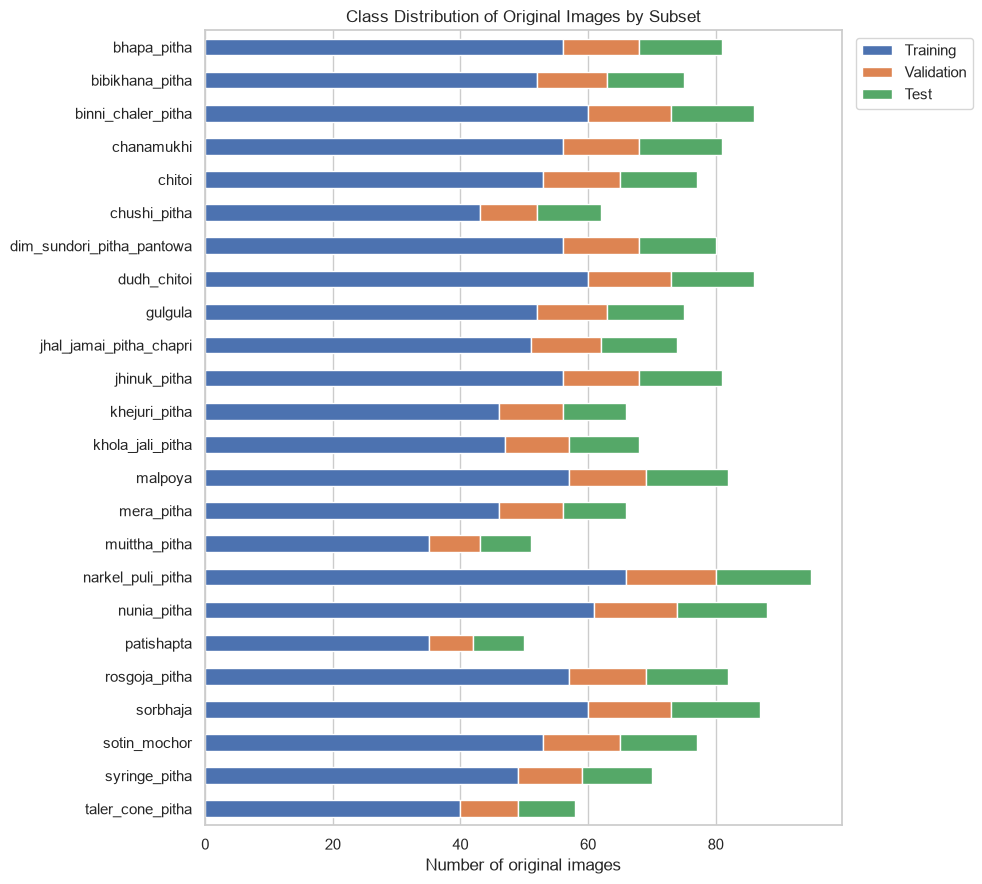

In [7]:
# ---------------------------------------------------------------- per-class image counts
train_labels_arr = np.array(train_labels)
val_labels_arr   = np.array(val_labels)
test_labels_arr  = np.array(test_labels)

inventory_rows = []
for cname in CLASS_NAMES:
    n_train_orig = int(((train_labels_arr == cname) & train_is_original).sum())
    n_train_aug  = int(((train_labels_arr == cname) & ~train_is_original).sum())
    n_val        = int((val_labels_arr == cname).sum())
    n_test       = int((test_labels_arr == cname).sum())
    inventory_rows.append([cname, n_train_orig, n_train_aug, n_val, n_test,
                           n_train_orig + n_val + n_test])

inventory = pd.DataFrame(inventory_rows, columns=['class', 'train_original', 'train_augmented',
                                                   'validation', 'test', 'total_original'])

# Append a totals row for the saved / displayed table
total_row = pd.DataFrame([['TOTAL'] + inventory.drop(columns='class').sum().tolist()],
                         columns=inventory.columns)
inventory_with_total = pd.concat([inventory, total_row], ignore_index=True)

display(inventory_with_total)
inventory_with_total.to_csv(TABLE_DIR / 'dataset_summary_by_class.csv', index=False)

# ---------------------------------------------------------------- class distribution chart (original images)
ax = inventory.set_index('class')[['train_original', 'validation', 'test']].plot(
    kind='barh', stacked=True, figsize=(10, 9), color=['#4C72B0', '#DD8452', '#55A868'])
ax.invert_yaxis()                      # keep alphabetical order from top to bottom
ax.set_xlabel('Number of original images')
ax.set_ylabel('')
ax.set_title('Class Distribution of Original Images by Subset')
ax.grid(axis='y', visible=False)
ax.legend(['Training', 'Validation', 'Test'], loc='upper left', bbox_to_anchor=(1.01, 1.0))   # legend outside the bars
plt.tight_layout()
plt.savefig(FIG_DIR / 'class_distribution.png')
plt.show()

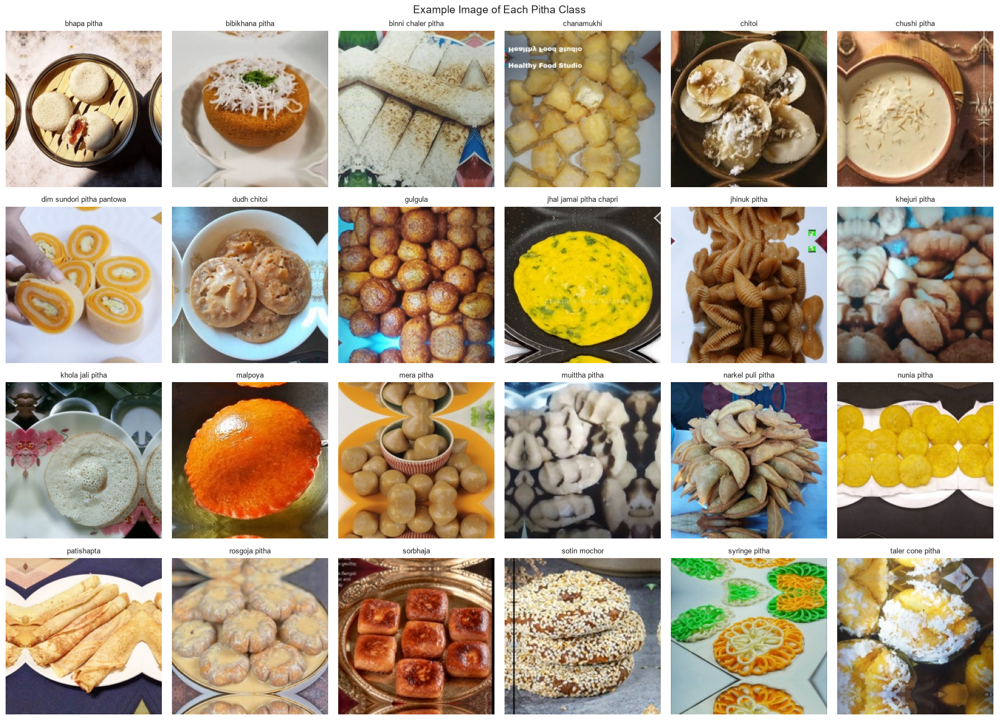

In [8]:
# ---------------------------------------------------------------- one example image per class
n_cols = 6
n_rows = math.ceil(len(CLASS_NAMES) / n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(3 * n_cols, 3.3 * n_rows))
axes = axes.reshape(-1)

for i, cname in enumerate(CLASS_NAMES):
    example_path = sample_image_for_class(cname)
    if example_path is not None:
        axes[i].imshow(load_and_orient_image(example_path))
    axes[i].set_title(cname.replace('_', ' '), fontsize=9)
    axes[i].axis('off')

# hide unused axes in the last row
for i in range(len(CLASS_NAMES), len(axes)):
    axes[i].axis('off')

plt.suptitle('Example Image of Each Pitha Class', fontsize=14)
plt.tight_layout()
plt.savefig(FIG_DIR / 'sample_images_per_class.png')
plt.show()

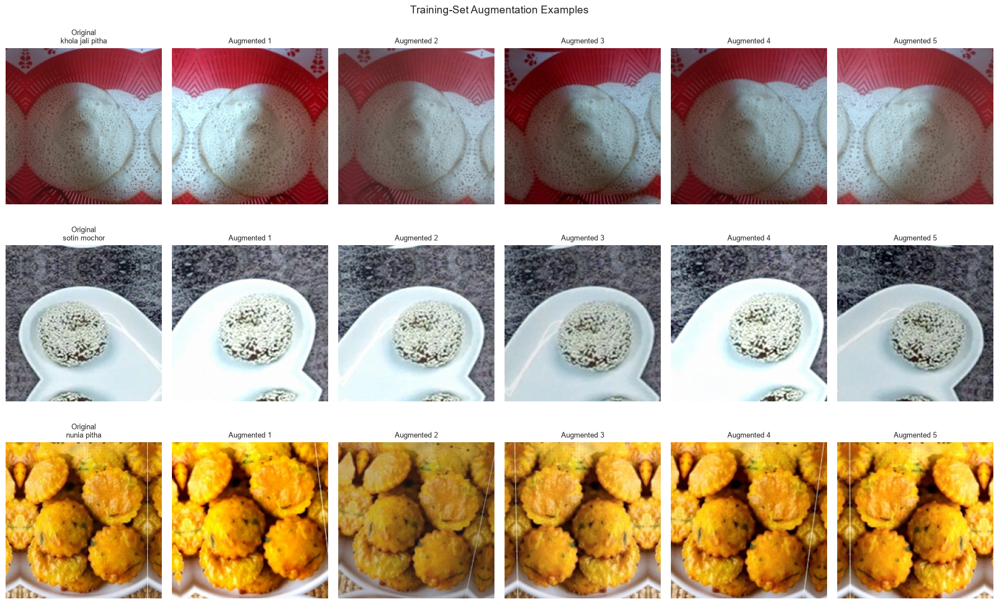

In [9]:
# ---------------------------------------------------------------- augmentation examples
# Three randomly chosen training images, each shown with its augmented copies
n_examples = 3
rng = np.random.RandomState(SEED)
original_positions = np.where(train_is_original)[0]
chosen_positions = rng.choice(original_positions, size=n_examples, replace=False)

fig, axes = plt.subplots(n_examples, NUM_AUGMENTS + 1,
                         figsize=(3 * (NUM_AUGMENTS + 1), 3.8 * n_examples))

for row, pos in enumerate(chosen_positions):
    original_path = train_paths[pos]
    # augmented copies are stored next to the original, named <original name>_aug*
    augmented_paths = sorted(original_path.parent.glob(original_path.stem + '_aug*'))
    shown_paths = [original_path] + augmented_paths[:NUM_AUGMENTS]

    for col in range(NUM_AUGMENTS + 1):
        axes[row, col].axis('off')
        if col < len(shown_paths):
            axes[row, col].imshow(load_and_orient_image(shown_paths[col]))
            if col == 0:
                axes[row, col].set_title(f'Original\n{train_labels[pos].replace("_", " ")}', fontsize=9)
            else:
                axes[row, col].set_title(f'Augmented {col}', fontsize=9)

plt.suptitle('Training-Set Augmentation Examples', fontsize=14)
plt.tight_layout()
plt.savefig(FIG_DIR / 'augmentation_examples.png')
plt.show()

## 5. Feature Extraction with a Frozen ConvNeXt-Tiny Backbone

ConvNeXt-Tiny is loaded with ImageNet weights and without its classification head. Global average pooling (followed by the network's final layer normalization) converts the final convolutional feature maps into a **768-dimensional** vector per image. The backbone is frozen: no fine-tuning is performed, and the network is used purely for inference.

Each image is loaded with EXIF orientation correction, resized with padding to `TARGET_SIZE` × `TARGET_SIZE` pixels (preserving the aspect ratio) and passed to `convnext.preprocess_input`, which leaves the pixel values in [0, 255] because ConvNeXt normalizes inside the network. Features are extracted for the training set (including augmented images), the validation set and the test set.

In [10]:
def build_convnext_extractor():
    # Frozen ConvNeXt-Tiny without the classification head; global average pooling gives a 768-d vector
    backbone = tf.keras.applications.ConvNeXtTiny(
        include_top=False, weights='imagenet', input_shape=(TARGET_SIZE, TARGET_SIZE, 3),
        pooling='avg')
    backbone.trainable = False
    return backbone

_preprocess = tf.keras.applications.convnext.preprocess_input

def extract_features(extractor, paths, batch_size=BATCH_SIZE):
    # Returns an (n_images, 768) feature matrix for the given list of image paths
    all_feats = []
    for i in range(0, len(paths), batch_size):
        batch = paths[i:i + batch_size]
        imgs = []
        for p in batch:
            pil_img = load_and_orient_image(p)
            padded = resize_with_pad(np.array(pil_img), size=TARGET_SIZE)   # RGB array
            imgs.append(padded.astype(np.float32))
        arr = np.stack(imgs, axis=0)
        arr = _preprocess(arr)                                    # identity: ConvNeXt normalizes inside the network
        feats = np.asarray(extractor(arr, training=False))        # inference only
        all_feats.append(feats)
        if (i // batch_size) % 20 == 0 and i > 0:
            print(f'    {min(i + batch_size, len(paths))}/{len(paths)} images processed...')
    return np.vstack(all_feats)

print('Building frozen ConvNeXt-Tiny backbone...')
extractor = build_convnext_extractor()
print(f'Pooled feature dimension: {extractor.output_shape[-1]}')

Building frozen ConvNeXt-Tiny backbone...

111650432/111650432 ━━━━━━━━━━━━━━━━━━━━ 93s 1us/step
Pooled feature dimension: 768


In [11]:
start_time = time.time()

print('Extracting TRAIN features...')
X_train_raw = extract_features(extractor, train_paths)
print('Extracting VALIDATION features...')
X_val_raw = extract_features(extractor, val_paths)
print('Extracting TEST features...')
X_test_raw = extract_features(extractor, test_paths)

extraction_minutes = (time.time() - start_time) / 60
print(f'\nFeature extraction finished in {extraction_minutes:.1f} minutes.')

feature_shapes = pd.DataFrame({
    'subset': ['Training (incl. augmented)', 'Validation', 'Test'],
    'images': [X_train_raw.shape[0], X_val_raw.shape[0], X_test_raw.shape[0]],
    'feature_dimension': [X_train_raw.shape[1], X_val_raw.shape[1], X_test_raw.shape[1]],
})
display(feature_shapes)
feature_shapes.to_csv(TABLE_DIR / 'feature_matrix_shapes.csv', index=False)

Extracting TRAIN features...
    336/7482 images processed...
    656/7482 images processed...
    976/7482 images processed...
    1296/7482 images processed...
    1616/7482 images processed...
    1936/7482 images processed...
    2256/7482 images processed...
    2576/7482 images processed...
    2896/7482 images processed...
    3216/7482 images processed...
    3536/7482 images processed...
    3856/7482 images processed...
    4176/7482 images processed...
    4496/7482 images processed...
    4816/7482 images processed...
    5136/7482 images processed...
    5456/7482 images processed...
    5776/7482 images processed...
    6096/7482 images processed...
    6416/7482 images processed...
    6736/7482 images processed...
    7056/7482 images processed...
    7376/7482 images processed...
Extracting VALIDATION features...
Extracting TEST features...

Feature extraction finished in 43.0 minutes.


,subset,images,feature_dimension
0,Training (incl. augmented),7482,768
1,Validation,268,768
2,Test,283,768


## 6. Dimensionality Reduction with PCA

The 768-dimensional features are projected onto `PCA_COMPONENTS` principal components. PCA is fitted **exclusively on the training features**; the validation and test features are only transformed. Fitting on evaluation data would let their variance shape the representation and bias the results. The cumulative explained-variance curve and a summary table are saved for reporting.

PCA components   : 256
Variance retained: 96.42%


,component,explained_variance_pct,cumulative_variance_pct
9,10,2.21,31.91
24,25,1.04,53.07
49,50,0.50,70.51
99,100,0.19,85.92
149,150,0.08,91.90
199,200,0.04,94.69
255,256,0.02,96.42


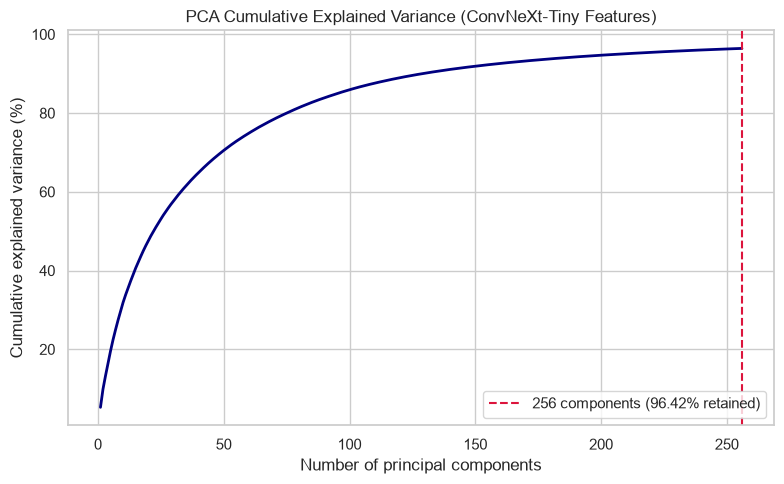


Saved: pitha_pca_convnext.pkl, pitha_features_convnext.npz, pitha_backbone_convnext.json


In [12]:
# PCA is fitted on the training features only; validation and test features are only transformed
n_components = min(PCA_COMPONENTS, X_train_raw.shape[0], X_train_raw.shape[1])
pca = PCA(n_components=n_components, random_state=SEED)
X_train = pca.fit_transform(X_train_raw)
X_val = pca.transform(X_val_raw)
X_test = pca.transform(X_test_raw)

variance_retained = float(pca.explained_variance_ratio_.astype(np.float64).sum() * 100)
print(f'PCA components   : {n_components}')
print(f'Variance retained: {variance_retained:.2f}%')

# ---------------------------------------------------------------- explained-variance table
variance_ratio = pca.explained_variance_ratio_.astype(np.float64)   # float64 avoids float32 rounding artifacts
variance_table = pd.DataFrame({
    'component': np.arange(1, n_components + 1),
    'explained_variance_pct': variance_ratio * 100,
    'cumulative_variance_pct': np.cumsum(variance_ratio) * 100,
})
variance_table.to_csv(TABLE_DIR / 'pca_explained_variance.csv', index=False)   # full table (all components)

# display only selected milestones to keep the notebook readable
milestone_rows = []
for m in (10, 25, 50, 100, 150, 200, n_components):
    if m <= n_components and (m - 1) not in milestone_rows:
        milestone_rows.append(m - 1)
display(variance_table.iloc[milestone_rows].round(2))

# ---------------------------------------------------------------- cumulative variance figure
plt.figure(figsize=(8, 5))
plt.plot(variance_table['component'], variance_table['cumulative_variance_pct'], color='navy', linewidth=2)
plt.axvline(n_components, color='crimson', linestyle='--',
            label=f'{n_components} components ({variance_retained:.2f}% retained)')
plt.xlabel('Number of principal components')
plt.ylabel('Cumulative explained variance (%)')
plt.title('PCA Cumulative Explained Variance (ConvNeXt-Tiny Features)')
plt.legend(loc='lower right')
plt.tight_layout()
plt.savefig(FIG_DIR / 'pca_cumulative_variance.png')
plt.show()

# ---------------------------------------------------------------- persist the transform and the features
joblib.dump(pca, MODEL_DIR / 'pitha_pca_convnext.pkl')
np.savez_compressed(MODEL_DIR / 'pitha_features_convnext.npz',
                    X_train=X_train, X_val=X_val, X_test=X_test,
                    train_labels=train_labels, val_labels=val_labels, test_labels=test_labels,
                    train_files=train_files, val_files=val_files, test_files=test_files)

backbone_info = {'backbone': 'ConvNeXt-Tiny', 'raw_dims': int(X_train_raw.shape[1]),
                 'pca_components': int(n_components),
                 'variance_retained_pct': float(variance_retained),
                 'preprocess': 'convnext.preprocess_input (tf: identity, normalization is built into the network; input range [0, 255])'}
with open(MODEL_DIR / 'pitha_backbone_convnext.json', 'w') as f:
    json.dump(backbone_info, f, indent=2)

print('\nSaved: pitha_pca_convnext.pkl, pitha_features_convnext.npz, pitha_backbone_convnext.json')

## 7. Classifier Training and Model Selection

Four classifiers are trained on the PCA-reduced training features (original and augmented images). Each classifier is trained once on the full training set and scored on both the validation and the test set. **The classifier with the highest validation accuracy is selected**; test metrics are reported alongside for completeness but play no role in the selection. Training time is recorded for each model.

Class labels are encoded as integers with a `LabelEncoder`, which is saved together with the selected model.

In [13]:
# Encode class names as integers (the encoder is saved and reused for inference)
le = LabelEncoder()
y_train = le.fit_transform(train_labels)
y_val = le.transform(val_labels)
y_test = le.transform(test_labels)
joblib.dump(le, MODEL_DIR / 'pitha_label_encoder.pkl')

CLASSIFIERS = {
    'SVM (RBF kernel)': SVC(kernel='rbf', gamma=0.01, C=1.0, probability=True, random_state=SEED),
    'Logistic Regression': LogisticRegression(max_iter=2000, random_state=SEED),
    'Random Forest (500 trees)': RandomForestClassifier(n_estimators=500, n_jobs=-1, random_state=SEED),
    'XGBoost (500 trees)': xgboost.XGBClassifier(
        n_estimators=500, objective='multi:softprob', eval_metric='mlogloss',
        n_jobs=-1, random_state=SEED),
}

results = {}
fitted_models = {}

for name, clf in CLASSIFIERS.items():
    print(f'Training: {name} ...')
    fit_start = time.time()
    clf.fit(X_train, y_train)
    train_time = time.time() - fit_start
    fitted_models[name] = clf

    # predictions on the validation and test sets
    val_pred = clf.predict(X_val)
    test_pred = clf.predict(X_test)

    # accuracy on both sets, plus additional test-set metrics
    val_acc = accuracy_score(y_val, val_pred)
    test_acc = accuracy_score(y_test, test_pred)
    prec_w, rec_w, f1_w, _ = precision_recall_fscore_support(y_test, test_pred, average='weighted', zero_division=0)
    _, _, f1_m, _ = precision_recall_fscore_support(y_test, test_pred, average='macro', zero_division=0)
    kappa = cohen_kappa_score(y_test, test_pred)

    results[name] = {'val_acc': val_acc, 'test_acc': test_acc,
                     'test_precision_weighted': prec_w, 'test_recall_weighted': rec_w,
                     'test_f1_weighted': f1_w, 'test_f1_macro': f1_m,
                     'test_kappa': kappa, 'train_time_s': train_time}
    print(f'  Validation accuracy: {val_acc*100:.2f}%')
    print(f'  Test accuracy      : {test_acc*100:.2f}%  (weighted F1 {f1_w:.4f}, kappa {kappa:.4f}, {train_time:.1f} s)\n')

# Comparison table, sorted by validation accuracy (the selection criterion)
results_df = pd.DataFrame(results).T.sort_values('val_acc', ascending=False)
print('Classifier comparison (sorted by validation accuracy - the selection criterion):')
display(results_df.round(4))
results_df.to_csv(TABLE_DIR / 'classifier_comparison.csv')

Training: SVM (RBF kernel) ...
  Validation accuracy: 39.55%
  Test accuracy      : 37.81%  (weighted F1 0.4541, kappa 0.3484, 33.2 s)

Training: Logistic Regression ...
  Validation accuracy: 85.45%
  Test accuracy      : 84.81%  (weighted F1 0.8483, kappa 0.8413, 0.6 s)

Training: Random Forest (500 trees) ...
  Validation accuracy: 77.24%
  Test accuracy      : 73.50%  (weighted F1 0.7232, kappa 0.7229, 13.7 s)

Training: XGBoost (500 trees) ...
  Validation accuracy: 75.00%
  Test accuracy      : 75.27%  (weighted F1 0.7506, kappa 0.7415, 66.7 s)

Classifier comparison (sorted by validation accuracy - the selection criterion):


,val_acc,test_acc,test_precision_weighted,test_recall_weighted,test_f1_weighted,test_f1_macro,test_kappa,train_time_s
Logistic Regression,0.8545,0.8481,0.8641,0.8481,0.8483,0.8456,0.8413,0.6298
Random Forest (500 trees),0.7724,0.7350,0.7347,0.7350,0.7232,0.7132,0.7229,13.6576
XGBoost (500 trees),0.7500,0.7527,0.7612,0.7527,0.7506,0.7392,0.7415,66.7476
SVM (RBF kernel),0.3955,0.3781,0.7816,0.3781,0.4541,0.4337,0.3484,33.2491


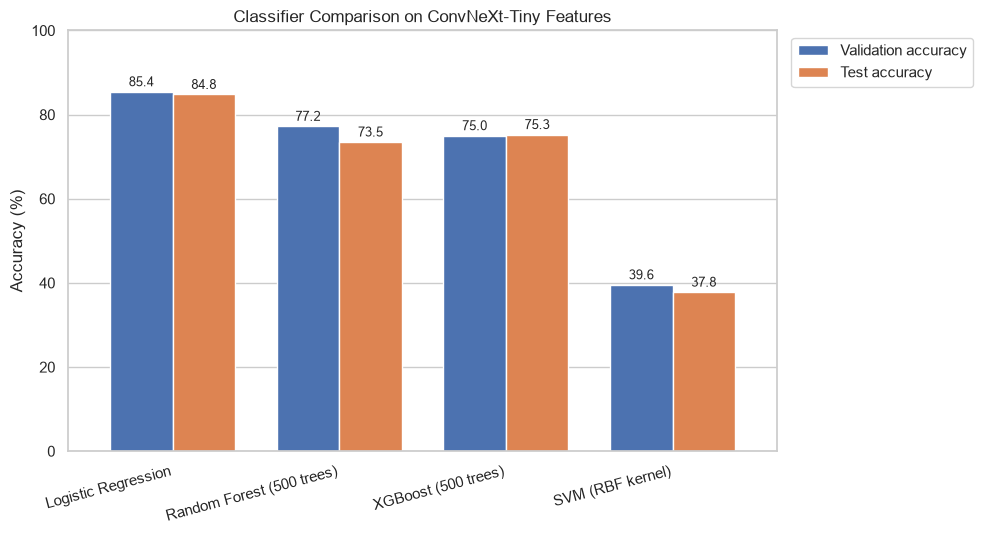

In [14]:
# ---------------------------------------------------------------- validation vs. test accuracy chart
accuracy_plot = results_df[['val_acc', 'test_acc']] * 100
accuracy_plot.columns = ['Validation accuracy', 'Test accuracy']

ax = accuracy_plot.plot(kind='bar', figsize=(10, 5.5), width=0.75, color=['#4C72B0', '#DD8452'])
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f', fontsize=9, padding=2)   # value labels on the bars
ax.set_ylabel('Accuracy (%)')
ax.set_ylim(0, 100)
ax.set_xlabel('')
ax.set_title('Classifier Comparison on ConvNeXt-Tiny Features')
plt.xticks(rotation=15, ha='right')
ax.grid(axis='x', visible=False)
ax.legend(loc='upper left', bbox_to_anchor=(1.01, 1.0))     # legend outside the bars
plt.tight_layout()
plt.savefig(FIG_DIR / 'classifier_accuracy_comparison.png')
plt.show()

In [15]:
# ---------------------------------------------------------------- model selection (validation accuracy only)
winner_name = results_df.index[0]
winner = fitted_models[winner_name]
print(f'Selected model: {winner_name}')
print(f'  Validation accuracy (selection criterion): {results[winner_name]["val_acc"]*100:.2f}%')
print(f'  Test accuracy (generalization estimate)  : {results[winner_name]["test_acc"]*100:.2f}%')

joblib.dump(winner, MODEL_DIR / 'pitha_model_convnext.pkl')
with open(MODEL_DIR / 'pitha_model_convnext.info.json', 'w') as f:
    json.dump({'classifier_name': winner_name,
               'val_accuracy': results[winner_name]['val_acc'] * 100,
               'test_accuracy': results[winner_name]['test_acc'] * 100,
               'test_f1_weighted': results[winner_name]['test_f1_weighted'],
               'test_f1_macro': results[winner_name]['test_f1_macro'],
               'test_kappa': results[winner_name]['test_kappa']}, f, indent=2)

print('\nSaved: pitha_model_convnext.pkl, pitha_model_convnext.info.json')

Selected model: Logistic Regression
  Validation accuracy (selection criterion): 85.45%
  Test accuracy (generalization estimate)  : 84.81%

Saved: pitha_model_convnext.pkl, pitha_model_convnext.info.json


In [16]:
import hashlib
def md5(p): return hashlib.md5(p.read_bytes()).hexdigest()

orig_hashes = {}
for split, paths, files in (('train', train_paths, train_files),
                            ('val', val_paths, val_files),
                            ('test', test_paths, test_files)):
    for p, f in zip(paths, files):
        if '_aug' in Path(f).stem:
            continue                      # augmented copies are new pixels, skip them
        orig_hashes.setdefault(md5(p), []).append((split, p.parent.name, f))

dupes = {h: v for h, v in orig_hashes.items() if len({s for s, _, _ in v}) > 1}
print('Identical originals across splits:', len(dupes))
for v in list(dupes.values())[:10]:
    print(v)

Identical originals across splits: 0


## 8. Cross-Validation (10-Fold, Grouped)

A single train/validation split yields one accuracy estimate whose variability is unknown. To quantify the stability of each classifier, stratified 10-fold cross-validation is performed on the training set. Because every training image has `NUM_AUGMENTS` augmented copies, a naive fold split would place an original image in one fold and its near-identical copies in the others, which leaks information and inflates the scores. The procedure below prevents this:

1. **Grouping.** An original image and all of its augmented copies form one group. `StratifiedGroupKFold` assigns whole groups to folds while preserving the class proportions.
2. **Training on augmented data.** Each fold trains on the original and augmented images of its training groups, matching the configuration of the final models.
3. **Scoring on originals only.** The held-out part of each fold is evaluated on original images only, so every real image is scored exactly once.
4. **PCA inside each fold.** The projection is refitted on the training portion of every fold.

Two assertions guard against leakage: no group may appear on both sides of a fold, and every original image must be scored exactly once. Cross-validation is a diagnostic of stability; it does **not** influence which model is selected.

In [17]:
from sklearn.model_selection import StratifiedGroupKFold   # splits by group and keeps class balance
from sklearn.base import clone                             # creates a fresh, untrained copy of a classifier

# ---------------------------------------------------------------- group identifiers
# An original image and all of its augmented copies receive the same group id.
# The class name is part of the id because filenames repeat across class folders.
group_ids = []
for i in range(len(train_files)):
    stem = Path(train_files[i]).stem             # filename without extension
    base_name = stem.split('_aug')[0]            # drop the "_aug..." suffix of augmented copies
    group_ids.append(train_labels[i] + '/' + base_name)
group_ids = np.array(group_ids)

n_groups = len(set(group_ids))
n_originals = int(train_is_original.sum())
print(f'Original images: {n_originals}')
print(f'Augmented copies: {int((~train_is_original).sum())}')
print(f'Unique groups  : {n_groups}')
assert n_groups == n_originals, 'Every group must contain exactly one original image.'

# ---------------------------------------------------------------- cross-validation loop
skf = StratifiedGroupKFold(n_splits=CV_FOLDS, shuffle=True, random_state=SEED)

cv_scores = {}                     # fold accuracies for each classifier
for name in CLASSIFIERS:
    cv_scores[name] = []

n_scored = 0                       # counts the originals that are scored across all folds
fold_number = 0

for train_idx, hold_idx in skf.split(X_train_raw, y_train, groups=group_ids):
    fold_number += 1

    # Leakage guard: no group may appear in both the training part and the held-out part
    shared_groups = set(group_ids[train_idx]) & set(group_ids[hold_idx])
    assert len(shared_groups) == 0, 'Leakage: a group appears on both sides of the fold.'

    # Score original images only (drop augmented copies from the held-out part)
    hold_idx = hold_idx[train_is_original[hold_idx]]
    n_scored += len(hold_idx)

    # Fit PCA on this fold's training rows only, then transform both parts
    fold_pca = PCA(n_components=min(PCA_COMPONENTS, len(train_idx)), random_state=SEED)
    X_fold_train = fold_pca.fit_transform(X_train_raw[train_idx])
    X_fold_hold = fold_pca.transform(X_train_raw[hold_idx])

    for name, clf in CLASSIFIERS.items():
        model = clone(clf)                                               # fresh untrained copy
        model.fit(X_fold_train, y_train[train_idx])                      # train on the fold's training rows
        pred = model.predict(X_fold_hold)                                # predict the held-out originals
        cv_scores[name].append(accuracy_score(y_train[hold_idx], pred))  # store this fold's accuracy

    print(f'Fold {fold_number}/{CV_FOLDS} done')

# Every original image must have been scored exactly once
assert n_scored == n_originals, 'Not every original image was scored exactly once.'
print(f'\nAll {n_scored} original training images were scored exactly once.')

Original images: 1247
Augmented copies: 6235
Unique groups  : 1247
Fold 1/10 done
Fold 2/10 done
Fold 3/10 done
Fold 4/10 done
Fold 5/10 done
Fold 6/10 done
Fold 7/10 done
Fold 8/10 done
Fold 9/10 done
Fold 10/10 done

All 1247 original training images were scored exactly once.


Per-fold accuracy (10-fold grouped cross-validation, training-set originals):


,SVM (RBF kernel),Logistic Regression,Random Forest (500 trees),XGBoost (500 trees)
fold,,,,
1,0.3680,0.8400,0.7600,0.7120
2,0.3040,0.8320,0.7760,0.7120
3,0.3520,0.8240,0.7600,0.7280
4,0.2800,0.8560,0.7680,0.7840
5,0.3226,0.8790,0.7903,0.7903
6,0.3226,0.8871,0.8387,0.7742
7,0.3200,0.7920,0.6880,0.7840
8,0.3387,0.9274,0.8548,0.8468
9,0.2381,0.8175,0.7143,0.7619



Summary:


,cv_mean_acc,cv_std_acc,cv_min_acc,cv_max_acc,mean ± std (%)
SVM (RBF kernel),0.3281,0.0526,0.2381,0.4355,32.81 ± 5.26
Logistic Regression,0.8518,0.0393,0.7920,0.9274,85.18 ± 3.93
Random Forest (500 trees),0.7765,0.0516,0.6880,0.8548,77.65 ± 5.16
XGBoost (500 trees),0.7675,0.0413,0.7120,0.8468,76.75 ± 4.13


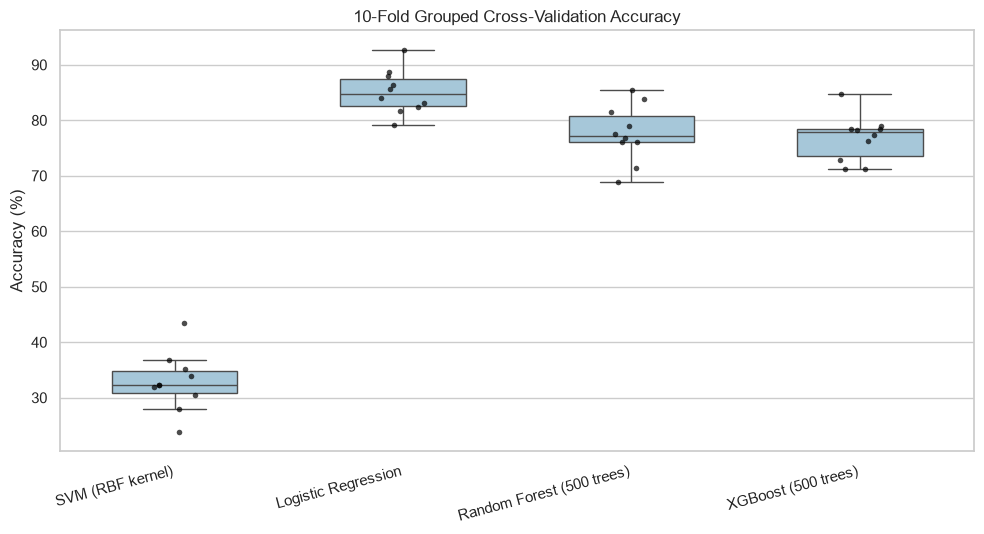

In [18]:
# ---------------------------------------------------------------- per-fold and summary tables
cv_table = pd.DataFrame(cv_scores)              # one row per fold, one column per classifier
cv_table.index = range(1, len(cv_table) + 1)
cv_table.index.name = 'fold'

cv_summary = pd.DataFrame({
    'cv_mean_acc': cv_table.mean(),
    'cv_std_acc': cv_table.std(),               # sample standard deviation (n - 1)
    'cv_min_acc': cv_table.min(),
    'cv_max_acc': cv_table.max(),
})

# Text column formatted for direct use in a report: "mean +/- std (%)"
summary_text = []
for name in cv_summary.index:
    mean_pct = cv_summary.loc[name, 'cv_mean_acc'] * 100
    std_pct = cv_summary.loc[name, 'cv_std_acc'] * 100
    summary_text.append(f'{mean_pct:.2f} ± {std_pct:.2f}')
cv_summary['mean ± std (%)'] = summary_text

print(f'Per-fold accuracy ({CV_FOLDS}-fold grouped cross-validation, training-set originals):')
display(cv_table.round(4))
print('\nSummary:')
display(cv_summary.round(4))

cv_table.to_csv(TABLE_DIR / 'cv_scores_per_fold.csv')
cv_summary.to_csv(TABLE_DIR / 'cv_summary.csv', encoding='utf-8-sig')

# ---------------------------------------------------------------- box plot of the fold accuracies
plt.figure(figsize=(10, 5.5))
sns.boxplot(data=cv_table * 100, color='#9ecae1', width=0.55, showfliers=False)   # all folds are drawn as points below
sns.stripplot(data=cv_table * 100, color='black', size=4, alpha=0.7)   # individual folds
plt.ylabel('Accuracy (%)')
plt.xlabel('')
plt.title(f'{CV_FOLDS}-Fold Grouped Cross-Validation Accuracy')
plt.xticks(rotation=15, ha='right')
plt.tight_layout()
plt.savefig(FIG_DIR / 'cv_accuracy_boxplot.png')
plt.show()

In [19]:
# ---------------------------------------------------------------- consolidated comparison table
consolidated = results_df[['val_acc', 'test_acc', 'test_precision_weighted', 'test_recall_weighted',
                           'test_f1_weighted', 'test_f1_macro', 'test_kappa']].join(
                           cv_summary[['cv_mean_acc', 'cv_std_acc']])

print('Consolidated classifier comparison (sorted by validation accuracy):')
display(consolidated.round(4))
consolidated.to_csv(TABLE_DIR / 'consolidated_classifier_results.csv')

Consolidated classifier comparison (sorted by validation accuracy):


,val_acc,test_acc,test_precision_weighted,test_recall_weighted,test_f1_weighted,test_f1_macro,test_kappa,cv_mean_acc,cv_std_acc
Logistic Regression,0.8545,0.8481,0.8641,0.8481,0.8483,0.8456,0.8413,0.8518,0.0393
Random Forest (500 trees),0.7724,0.7350,0.7347,0.7350,0.7232,0.7132,0.7229,0.7765,0.0516
XGBoost (500 trees),0.7500,0.7527,0.7612,0.7527,0.7506,0.7392,0.7415,0.7675,0.0413
SVM (RBF kernel),0.3955,0.3781,0.7816,0.3781,0.4541,0.4337,0.3484,0.3281,0.0526


## 9. Test-Set Evaluation of the Selected Model

The selected classifier is evaluated on the held-out test set. The following results are reported:

- overall accuracy, top-3 accuracy and top-5 accuracy;
- macro- and weighted-averaged precision, recall and F1-score, Cohen's kappa and the Matthews correlation coefficient (MCC);
- per-class precision, recall, F1-score and support;
- confusion matrices (raw counts and row-normalized);
- one-vs-rest ROC curves and ROC-AUC (macro-average and per class).

Some classes contain only a few test images, so their per-class figures, and in particular the per-class ROC-AUC, carry wide sampling uncertainty and should be interpreted with caution.

In [20]:
y_test_pred = winner.predict(X_test)
if hasattr(winner, 'predict_proba'):
    y_test_proba = winner.predict_proba(X_test)
else:
    y_test_proba = None
n_classes = len(le.classes_)

# ---------------------------------------------------------------- per-class metrics
report_dict = classification_report(y_test, y_test_pred, target_names=le.classes_,
                                    output_dict=True, zero_division=0)
report_df = pd.DataFrame(report_dict).T
report_df.loc['accuracy', 'support'] = len(y_test)      # the support of the accuracy row is the test-set size

print('Per-class precision, recall and F1-score:')
display(report_df.round(4))
report_df.to_csv(TABLE_DIR / 'per_class_metrics.csv')

# ---------------------------------------------------------------- overall metrics
prec_m, rec_m, f1_m, _ = precision_recall_fscore_support(y_test, y_test_pred, average='macro', zero_division=0)
prec_w, rec_w, f1_w, _ = precision_recall_fscore_support(y_test, y_test_pred, average='weighted', zero_division=0)

top3_acc = np.nan
top5_acc = np.nan
macro_auc = np.nan
y_test_bin = None
if y_test_proba is not None:
    all_labels = np.arange(n_classes)
    top3_acc = top_k_accuracy_score(y_test, y_test_proba, k=3, labels=all_labels)
    top5_acc = top_k_accuracy_score(y_test, y_test_proba, k=5, labels=all_labels)
    y_test_bin = label_binarize(y_test, classes=all_labels)      # one-vs-rest indicator matrix
    try:
        macro_auc = roc_auc_score(y_test_bin, y_test_proba, average='macro')
    except ValueError as e:
        print(f'Macro ROC-AUC could not be computed: {e}')

overall_metrics = pd.DataFrame({
    'metric': ['Accuracy', 'Top-3 accuracy', 'Top-5 accuracy',
               'Precision (macro)', 'Recall (macro)', 'F1-score (macro)',
               'Precision (weighted)', 'Recall (weighted)', 'F1-score (weighted)',
               "Cohen's kappa", 'Matthews correlation coefficient', 'ROC-AUC (macro, one-vs-rest)'],
    'value': [accuracy_score(y_test, y_test_pred), top3_acc, top5_acc,
              prec_m, rec_m, f1_m, prec_w, rec_w, f1_w,
              cohen_kappa_score(y_test, y_test_pred), matthews_corrcoef(y_test, y_test_pred), macro_auc],
})

print(f'\nOverall test-set metrics - {winner_name}:')
display(overall_metrics.round(4))
overall_metrics.to_csv(TABLE_DIR / 'overall_test_metrics.csv', index=False)

Per-class precision, recall and F1-score:


,precision,recall,f1-score,support
bhapa_pitha,0.7500,0.9231,0.8276,13.0
bibikhana_pitha,0.9000,0.7500,0.8182,12.0
binni_chaler_pitha,0.9167,0.8462,0.8800,13.0
chanamukhi,0.9231,0.9231,0.9231,13.0
chitoi,0.9091,0.8333,0.8696,12.0
chushi_pitha,0.6923,0.9000,0.7826,10.0
dim_sundori_pitha_pantowa,1.0000,1.0000,1.0000,12.0
dudh_chitoi,0.6875,0.8462,0.7586,13.0
gulgula,1.0000,0.5833,0.7368,12.0
jhal_jamai_pitha_chapri,1.0000,0.8333,0.9091,12.0



Overall test-set metrics - Logistic Regression:


,metric,value
0,Accuracy,0.8481
1,Top-3 accuracy,0.9505
2,Top-5 accuracy,0.9788
3,Precision (macro),0.8621
4,Recall (macro),0.8447
5,F1-score (macro),0.8456
6,Precision (weighted),0.8641
7,Recall (weighted),0.8481
8,F1-score (weighted),0.8483
9,Cohen's kappa,0.8413


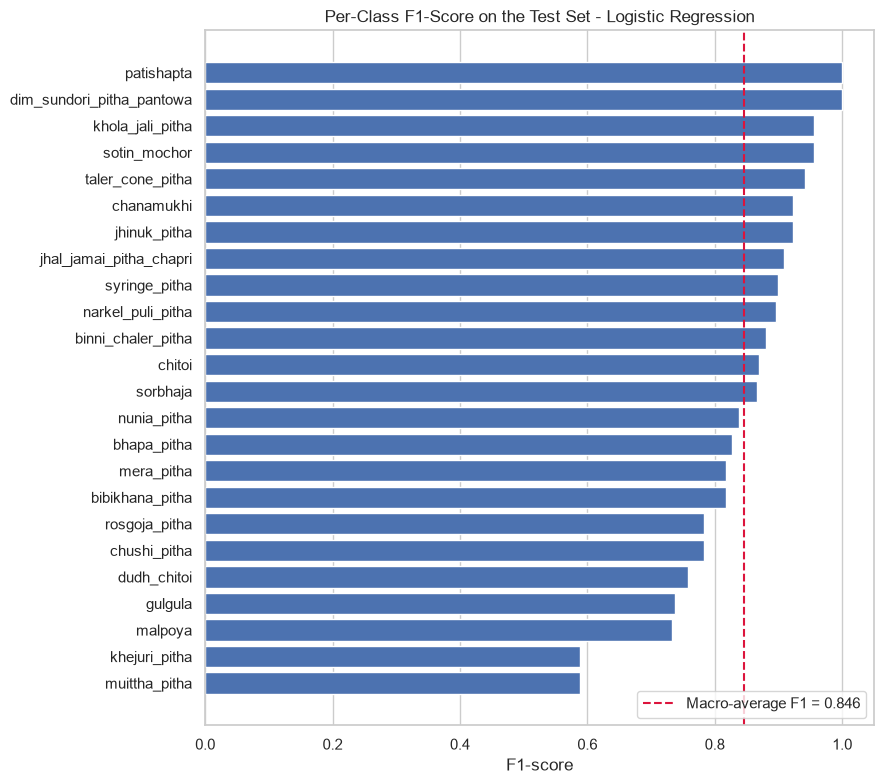

In [21]:
# ---------------------------------------------------------------- per-class F1-score chart
per_class_f1 = report_df.loc[list(le.classes_)].sort_values('f1-score')

plt.figure(figsize=(9, 8))
plt.barh(per_class_f1.index, per_class_f1['f1-score'], color='#4C72B0')
plt.axvline(f1_m, color='crimson', linestyle='--', label=f'Macro-average F1 = {f1_m:.3f}')
plt.xlabel('F1-score')
plt.xlim(0, 1.05)
plt.title(f'Per-Class F1-Score on the Test Set - {winner_name}')
plt.grid(axis='y', visible=False)
plt.legend(loc='lower right')
plt.tight_layout()
plt.savefig(FIG_DIR / 'per_class_f1.png')
plt.show()

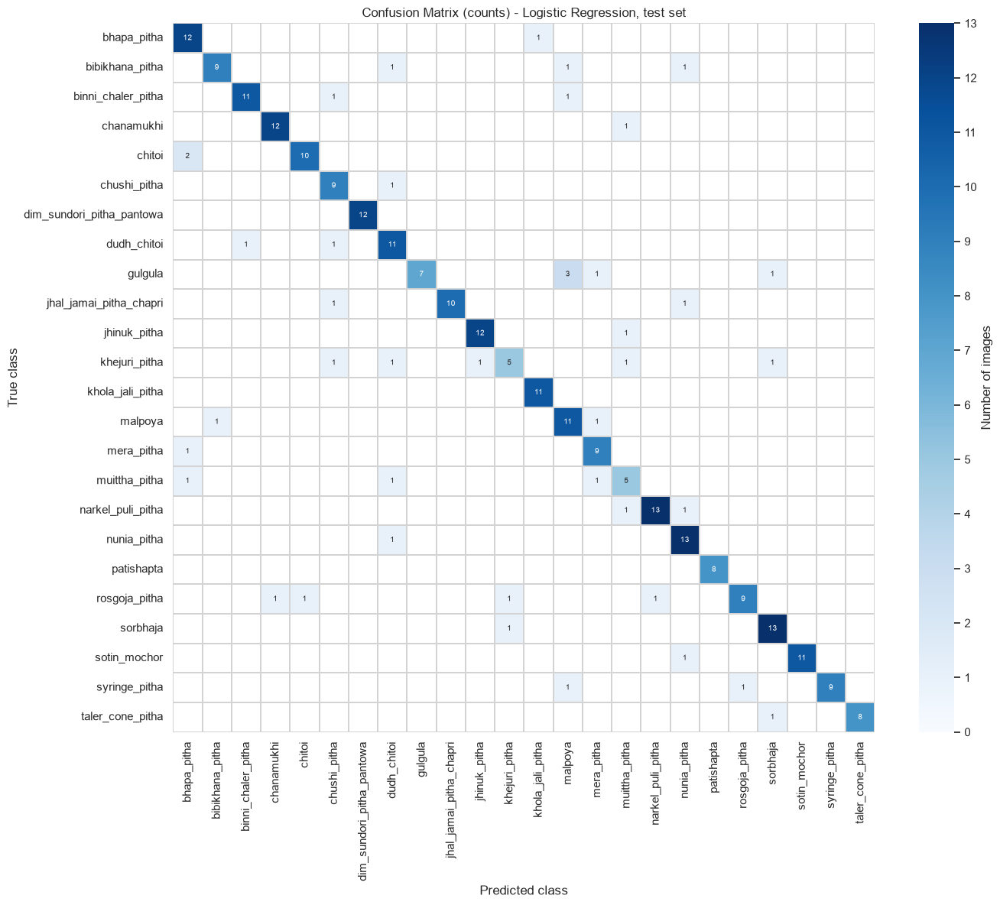

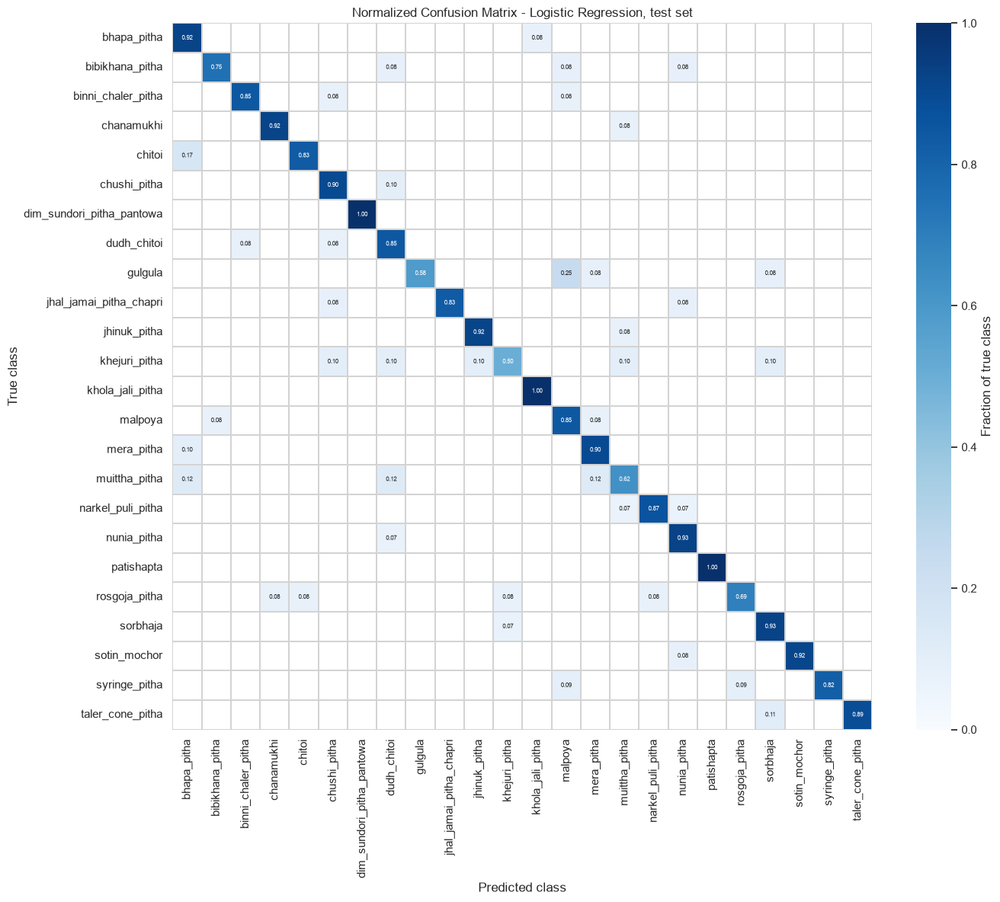

In [22]:
# ---------------------------------------------------------------- confusion matrix (raw counts)
cm = confusion_matrix(y_test, y_test_pred)
cm_table = pd.DataFrame(cm, index=le.classes_, columns=le.classes_)
cm_table.to_csv(TABLE_DIR / 'confusion_matrix_counts.csv')

plt.figure(figsize=(14, 12))
ax = sns.heatmap(cm, mask=(cm == 0), annot=True, fmt='d', cmap='Blues', vmin=0, vmax=cm.max(),
                 annot_kws={'size': 7}, cbar_kws={'label': 'Number of images', 'ticks': np.arange(0, cm.max() + 1)},
                 xticklabels=le.classes_, yticklabels=le.classes_, linewidths=0.3, linecolor='lightgray')
ax.grid(False)
plt.xlabel('Predicted class')
plt.ylabel('True class')
plt.title(f'Confusion Matrix (counts) - {winner_name}, test set')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig(FIG_DIR / 'confusion_matrix.png')
plt.show()

# ---------------------------------------------------------------- confusion matrix (row-normalized)
# Each row is divided by the number of true samples of that class, so the diagonal shows the per-class recall
row_totals = np.maximum(cm.sum(axis=1, keepdims=True), 1)     # avoid division by zero
cm_norm = cm / row_totals

plt.figure(figsize=(14, 12))
ax = sns.heatmap(cm_norm, mask=(cm == 0), annot=True, fmt='.2f', cmap='Blues', vmin=0, vmax=1,
                 annot_kws={'size': 6}, cbar_kws={'label': 'Fraction of true class'},
                 xticklabels=le.classes_, yticklabels=le.classes_, linewidths=0.3, linecolor='lightgray')
ax.grid(False)
plt.xlabel('Predicted class')
plt.ylabel('True class')
plt.title(f'Normalized Confusion Matrix - {winner_name}, test set')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig(FIG_DIR / 'confusion_matrix_normalized.png')
plt.show()

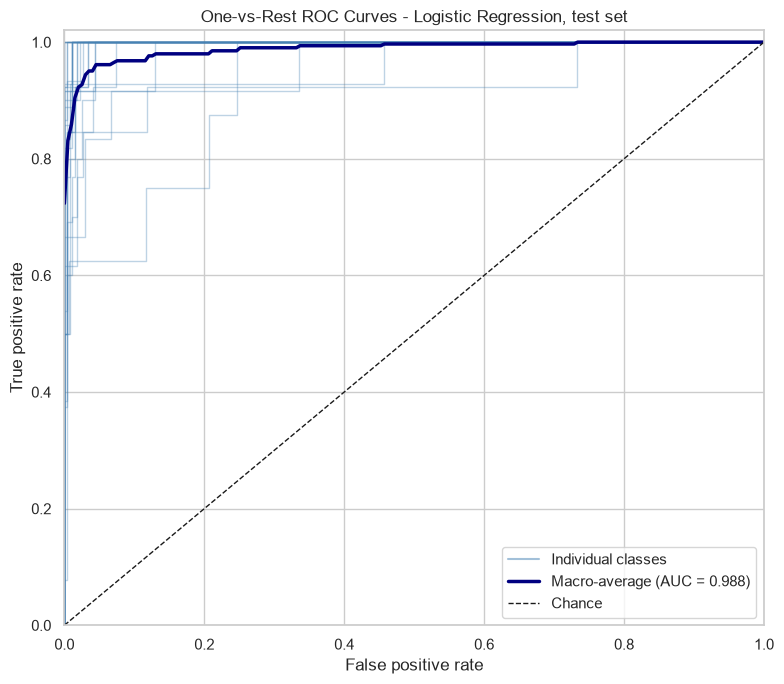

Per-class ROC-AUC (NaN = too few test samples):


,ROC_AUC,support
dim_sundori_pitha_pantowa,1.0000,12.0
khola_jali_pitha,1.0000,11.0
patishapta,1.0000,8.0
chanamukhi,0.9997,13.0
jhal_jamai_pitha_chapri,0.9997,12.0
jhinuk_pitha,0.9991,13.0
taler_cone_pitha,0.9988,9.0
sorbhaja,0.9987,14.0
narkel_puli_pitha,0.9980,15.0
syringe_pitha,0.9980,11.0


In [23]:
# ---------------------------------------------------------------- ROC curves and per-class ROC-AUC
if y_test_proba is not None:
    fpr_grid = np.linspace(0, 1, 200)      # common false-positive-rate axis for averaging
    tpr_interpolated = []

    plt.figure(figsize=(8, 7))
    for i, cname in enumerate(le.classes_):
        if y_test_bin[:, i].sum() == 0:    # class absent from the test set: no ROC curve
            continue
        fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_test_proba[:, i])
        plt.plot(fpr, tpr, color='steelblue', alpha=0.35, linewidth=1)
        tpr_interpolated.append(np.interp(fpr_grid, fpr, tpr))

    mean_tpr = np.mean(tpr_interpolated, axis=0)                  # macro-average curve
    plt.plot([], [], color='steelblue', alpha=0.5, label='Individual classes')
    plt.plot(fpr_grid, mean_tpr, color='navy', linewidth=2.5,
             label=f'Macro-average (AUC = {macro_auc:.3f})')
    plt.plot([0, 1], [0, 1], 'k--', linewidth=1, label='Chance')
    plt.xlim(0, 1)
    plt.ylim(0, 1.02)
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.title(f'One-vs-Rest ROC Curves - {winner_name}, test set')
    plt.legend(loc='lower right')
    plt.tight_layout()
    plt.savefig(FIG_DIR / 'roc_curves.png')
    plt.show()

    # per-class ROC-AUC table
    per_class_auc = {}
    for i, cname in enumerate(le.classes_):
        try:
            per_class_auc[cname] = roc_auc_score(y_test_bin[:, i], y_test_proba[:, i])
        except ValueError:
            per_class_auc[cname] = float('nan')     # too few samples for this class

    auc_df = pd.DataFrame.from_dict(per_class_auc, orient='index', columns=['ROC_AUC'])
    auc_df = auc_df.join(report_df[['support']])
    auc_df = auc_df.sort_values('ROC_AUC', ascending=False)

    print('Per-class ROC-AUC (NaN = too few test samples):')
    display(auc_df.round(4))
    auc_df.to_csv(TABLE_DIR / 'per_class_roc_auc.csv')
else:
    print(f'{winner_name} does not provide probability estimates - ROC analysis skipped.')

## 10. Error Analysis

Every test image that the selected model classified incorrectly is listed with its true class, its predicted class and the confidence of the prediction. Because filenames are numeric serial numbers that are unique only within a class folder, each image is identified by its relative path (`test/<class>/<filename>`).

The section further reports the most frequent confusions between pairs of classes, compares the confidence distribution of correct and incorrect predictions, and shows a gallery of all misclassified test images.

In [24]:
pred_labels = le.inverse_transform(y_test_pred)
true_labels_arr = le.inverse_transform(y_test)
if y_test_proba is not None:
    confidences = y_test_proba.max(axis=1)              # probability of the predicted class
else:
    confidences = np.full(len(y_test_pred), np.nan)

mis_idx = np.where(y_test_pred != y_test)[0]            # positions of the misclassified test images

mis_df = pd.DataFrame({
    'image_path': [test_paths[i].relative_to(SPLIT_DIR).as_posix() for i in mis_idx],
    'filename': [test_files[i] for i in mis_idx],
    'true_label': [true_labels_arr[i] for i in mis_idx],
    'predicted_label': [pred_labels[i] for i in mis_idx],
    'confidence': [confidences[i] for i in mis_idx],
}).sort_values(['true_label', 'filename']).reset_index(drop=True)

print(f'{len(mis_df)} of {len(y_test)} test images were misclassified ({len(mis_df) / len(y_test) * 100:.1f}%).\n')
display(mis_df.round(4))
mis_df.to_csv(TABLE_DIR / 'misclassified_test_images.csv', index=False)

43 of 283 test images were misclassified (15.2%).



,image_path,filename,true_label,predicted_label,confidence
0,test/bhapa_pitha/54.jpg,54.jpg,bhapa_pitha,khola_jali_pitha,0.3652
1,test/bibikhana_pitha/13.jpg,13.jpg,bibikhana_pitha,dudh_chitoi,0.6674
2,test/bibikhana_pitha/28.jpg,28.jpg,bibikhana_pitha,malpoya,0.9328
3,test/bibikhana_pitha/41.jpg,41.jpg,bibikhana_pitha,nunia_pitha,0.5484
4,test/binni_chaler_pitha/1.jpg,1.jpg,binni_chaler_pitha,chushi_pitha,0.8814
5,test/binni_chaler_pitha/69.jpg,69.jpg,binni_chaler_pitha,malpoya,0.4643
6,test/chanamukhi/50.jpg,50.jpg,chanamukhi,muittha_pitha,0.4939
7,test/chitoi/13.jpg,13.jpg,chitoi,bhapa_pitha,0.5853
8,test/chitoi/20.jpg,20.jpg,chitoi,bhapa_pitha,0.9967
9,test/chushi_pitha/18.jpg,18.jpg,chushi_pitha,dudh_chitoi,0.9212


Most frequent confusions (true class -> predicted class):


,true_label,predicted_label,count
0,gulgula,malpoya,3
1,chitoi,bhapa_pitha,2
2,bibikhana_pitha,malpoya,1
3,bhapa_pitha,khola_jali_pitha,1
4,bibikhana_pitha,nunia_pitha,1
5,binni_chaler_pitha,chushi_pitha,1
6,binni_chaler_pitha,malpoya,1
7,bibikhana_pitha,dudh_chitoi,1
8,chanamukhi,muittha_pitha,1
9,chushi_pitha,dudh_chitoi,1



Mean confidence - correct: 0.952, misclassified: 0.722


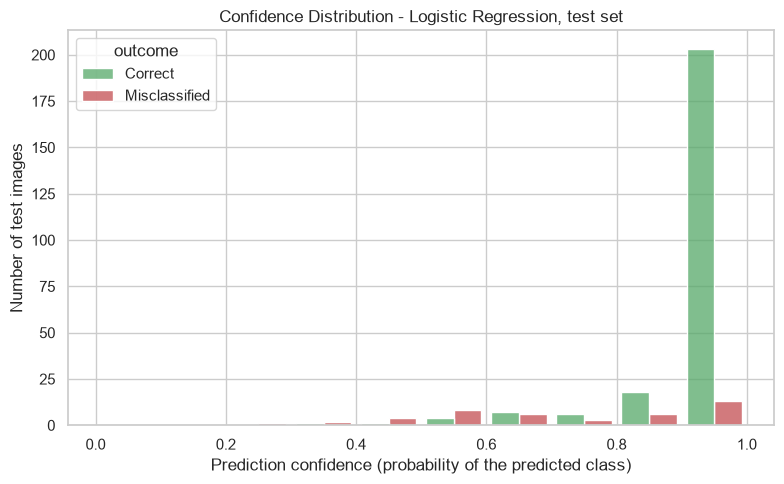

In [25]:
# ---------------------------------------------------------------- most frequent class confusions
confusion_pairs = []
for i in range(n_classes):
    for j in range(n_classes):
        if i != j and cm[i, j] > 0:
            confusion_pairs.append([le.classes_[i], le.classes_[j], int(cm[i, j])])

pairs_df = pd.DataFrame(confusion_pairs, columns=['true_label', 'predicted_label', 'count'])
pairs_df = pairs_df.sort_values('count', ascending=False).reset_index(drop=True)

print('Most frequent confusions (true class -> predicted class):')
display(pairs_df.head(15))
pairs_df.to_csv(TABLE_DIR / 'top_confused_class_pairs.csv', index=False)   # full list of confusions

# ---------------------------------------------------------------- confidence of correct vs. incorrect predictions
if y_test_proba is not None:
    is_correct = (y_test_pred == y_test)
    confidence_df = pd.DataFrame({
        'confidence': confidences,
        'outcome': np.where(is_correct, 'Correct', 'Misclassified'),
    })
    # mean confidence of each group (NaN if the group is empty, e.g. no misclassified images)
    mean_conf_correct = confidences[is_correct].mean() if is_correct.any() else np.nan
    mean_conf_wrong = confidences[~is_correct].mean() if (~is_correct).any() else np.nan
    print(f'\nMean confidence - correct: {mean_conf_correct:.3f}, misclassified: {mean_conf_wrong:.3f}')

    plt.figure(figsize=(8, 5))
    sns.histplot(data=confidence_df, x='confidence', hue='outcome', bins=10, binrange=(0, 1),
                 multiple='dodge', palette={'Correct': '#55A868', 'Misclassified': '#C44E52'}, shrink=0.85)
    plt.xlabel('Prediction confidence (probability of the predicted class)')
    plt.ylabel('Number of test images')
    plt.title(f'Confidence Distribution - {winner_name}, test set')
    plt.tight_layout()
    plt.savefig(FIG_DIR / 'confidence_distribution.png')
    plt.show()

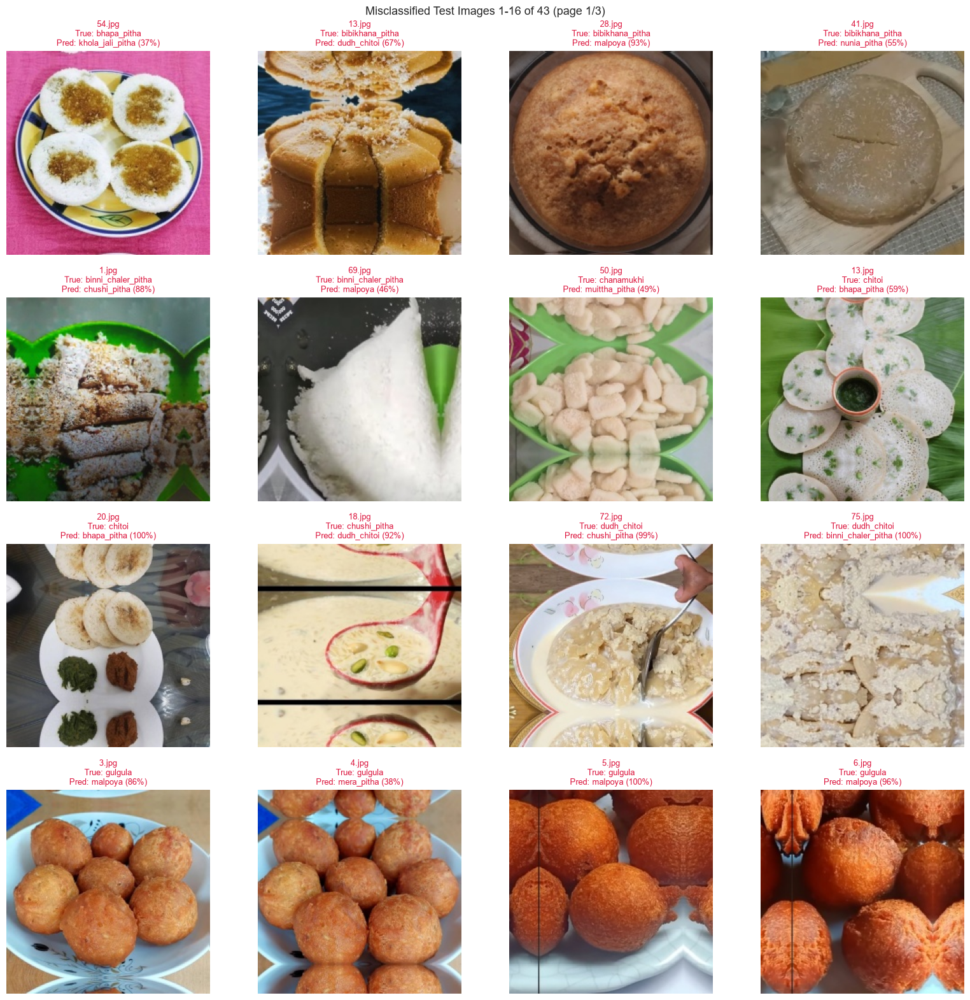

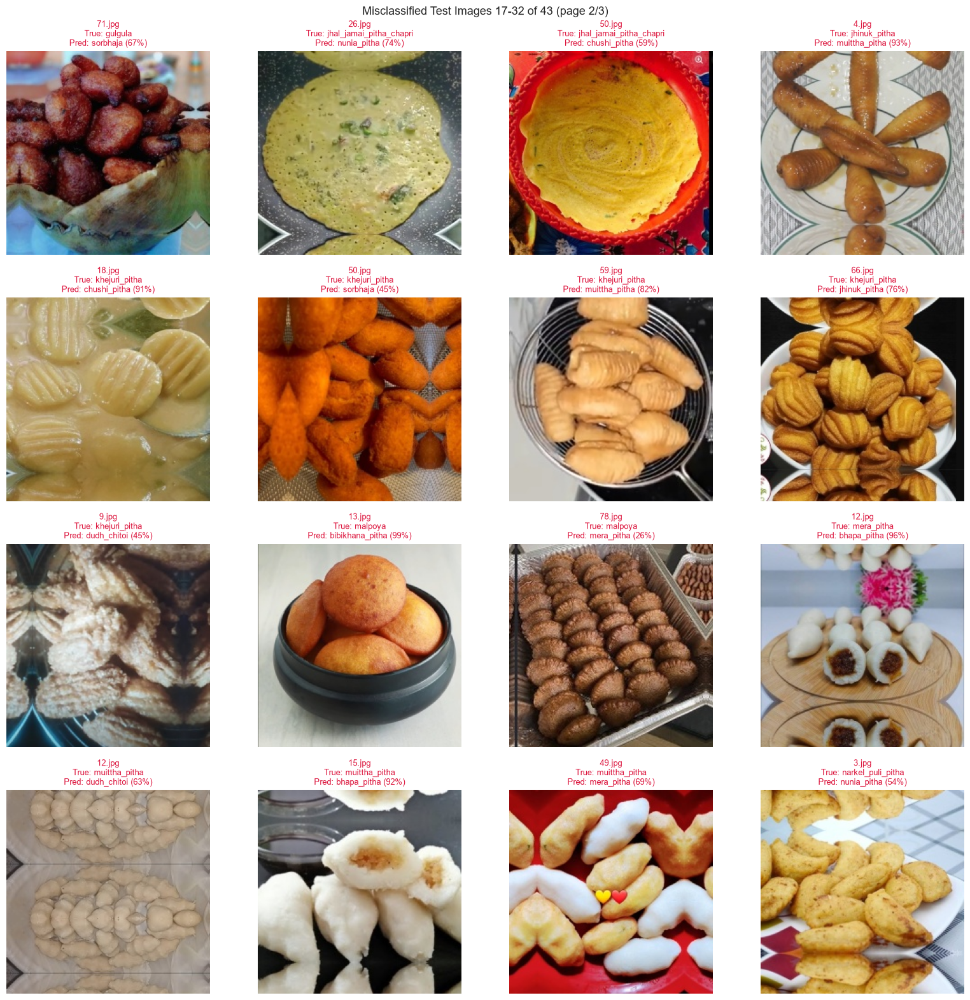

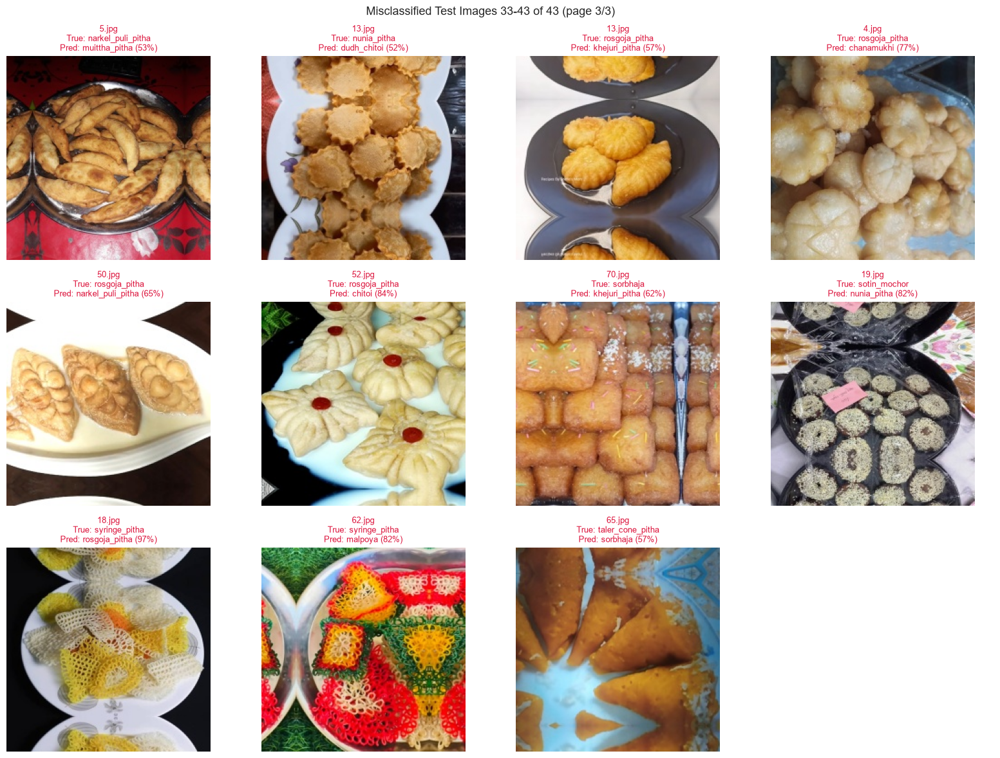

All 43 misclassified images are shown on 3 page(s).


In [26]:
# ---------------------------------------------------------------- gallery of all misclassified test images
n_cols = 4
total = len(mis_idx)
num_pages = math.ceil(total / MISCLASSIFIED_PER_PAGE)

if total == 0:
    print('No misclassified test images - nothing to plot.')
else:
    # one pass of the loop produces one figure (page) of the gallery
    for page in range(num_pages):
        start = page * MISCLASSIFIED_PER_PAGE                 # first image on this page
        end = min(start + MISCLASSIFIED_PER_PAGE, total)      # the last page may be shorter
        page_idx = mis_idx[start:end]

        n_rows = math.ceil(len(page_idx) / n_cols)
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
        axes = np.array(axes).reshape(-1)

        for ax_i, idx in enumerate(page_idx):
            axes[ax_i].imshow(load_and_orient_image(test_paths[idx]))
            axes[ax_i].axis('off')
            if np.isnan(confidences[idx]):
                conf_str = 'n/a'
            else:
                conf_str = f'{confidences[idx] * 100:.0f}%'
            axes[ax_i].set_title(
                f'{test_files[idx]}\nTrue: {true_labels_arr[idx]}\nPred: {pred_labels[idx]} ({conf_str})',
                fontsize=9, color='crimson')

        # hide unused axes on the last page
        for ax_i in range(len(page_idx), len(axes)):
            axes[ax_i].axis('off')

        plt.suptitle(f'Misclassified Test Images {start + 1}-{end} of {total} (page {page + 1}/{num_pages})',
                     fontsize=13)
        plt.tight_layout()
        plt.savefig(FIG_DIR / f'misclassified_test_images_page{page + 1}.png')
        plt.show()

    print(f'All {total} misclassified images are shown on {num_pages} page(s).')

## 11. Inference Demonstration

This section demonstrates the deployed pipeline on a single external image: ConvNeXt-Tiny feature extraction, the saved PCA projection, and the selected classifier. Set `QUERY_IMAGE_PATH` to any image file. If the true class is known, set `QUERY_IMAGE_TRUE_LABEL` to the exact class folder name; a wrong prediction is then displayed next to a reference image of the true class and one of the predicted class for visual comparison. Leave it as `None` when the true class is unknown.

The prediction is accompanied by the class metadata stored in `pitha_metadata.json` (region, cooking method, ingredients, nutritional values), and the three most probable classes are tabulated. If the image file does not exist, the demonstration is skipped.

In [27]:
QUERY_IMAGE_PATH = BASE_DIR / 'test_images' / 'gulgula_01.png'   # image to classify
QUERY_IMAGE_TRUE_LABEL = None                                         # true class name, or None if unknown

# Class metadata (optional)
metadata_path = SCRIPT_DIR / 'pitha_metadata.json'
if metadata_path.exists():
    with open(metadata_path, encoding='utf-8') as f:
        METADATA = json.load(f)
else:
    METADATA = {}
    print('pitha_metadata.json not found - only the class label will be reported.')

def classify_one(image_path):
    # Runs the full pipeline on one image; returns (predicted label, confidence, image, class probabilities)
    pil_img = load_and_orient_image(image_path)
    padded = resize_with_pad(np.array(pil_img), size=TARGET_SIZE).astype(np.float32)
    arr = _preprocess(np.expand_dims(padded, axis=0))
    feat_raw = np.asarray(extractor(arr, training=False))     # ConvNeXt-Tiny features
    feat_pca = pca.transform(feat_raw)                        # saved PCA projection
    pred_idx = winner.predict(feat_pca)[0]
    pred_label = le.inverse_transform([pred_idx])[0]
    if hasattr(winner, 'predict_proba'):
        proba = winner.predict_proba(feat_pca)[0]
        confidence = float(proba[pred_idx])
    else:
        proba = None
        confidence = None
    return pred_label, confidence, pil_img, proba

run_inference = QUERY_IMAGE_PATH.exists()

if not run_inference:
    print(f'Query image not found: {QUERY_IMAGE_PATH}')
    print('Set QUERY_IMAGE_PATH to an existing image to run the demonstration.')
else:
    pred_label, confidence, query_img, proba = classify_one(QUERY_IMAGE_PATH)
    meta = METADATA.get(pred_label, {})

    print(f"Predicted pitha type : {meta.get('display_name', pred_label)}")
    if confidence is not None:
        print(f'Confidence           : {confidence * 100:.1f}%')
    print(f"Division / District  : {meta.get('division', '?')} / {meta.get('district', '?')}")
    print(f"Cooking method       : {meta.get('cooking_method', '?')}")
    if meta.get('key_ingredients'):
        print(f"Key ingredients      : {', '.join(meta['key_ingredients'])}")
    print(f"Recipe summary       : {meta.get('recipe_summary', '?')}")

    # Nutritional values (per serving as given in the metadata file)
    print('Nutritional values:')
    for key, label in [('calories', 'Calories'), ('protein_g', 'Protein (g)'),
                       ('carbs_g', 'Carbohydrates (g)'), ('fat_g', 'Fat (g)'), ('sugar_g', 'Sugar (g)')]:
        if key in meta:
            print(f'  {label:18}: {meta[key]}')

    # ---------------------------------------------------------------- result tables
    inference_result = pd.DataFrame([{
        'image': QUERY_IMAGE_PATH.name,
        'predicted_class': pred_label,
        'confidence': confidence,
        'division': meta.get('division'),
        'district': meta.get('district'),
        'cooking_method': meta.get('cooking_method'),
        'key_ingredients': ', '.join(meta.get('key_ingredients', [])),
    }])
    inference_result.to_csv(TABLE_DIR / 'inference_result.csv', index=False, encoding='utf-8-sig')

    if proba is not None:
        top3_idx = np.argsort(proba)[::-1][:3]          # indices of the three most probable classes
        top3_df = pd.DataFrame({'rank': [1, 2, 3],
                                'class': le.classes_[top3_idx],
                                'probability': proba[top3_idx]})
        print('\nTop-3 predictions:')
        display(top3_df.round(4))
        top3_df.to_csv(TABLE_DIR / 'inference_top3.csv', index=False)

Predicted pitha type : Malpoya
Confidence           : 99.8%
Division / District  : Khulna / Jhenaidah
Cooking method       : pan_fried
Key ingredients      : all-purpose flour, rice flour, semolina, milk, sugar, fennel seeds, cardamom
Recipe summary       : Thick batter of flour, semolina, milk, sugar, and fennel is rested, then spoonfuls are shallow-fried in ghee/oil until golden on both sides. Served warm, optionally with jaggery syrup.
Nutritional values:
  Calories          : 230
  Protein (g)       : 4
  Carbohydrates (g) : 35
  Fat (g)           : 8
  Sugar (g)         : 14

Top-3 predictions:


,rank,class,probability
0,1,malpoya,0.9985
1,2,gulgula,0.0013
2,3,khejuri_pitha,0.0001


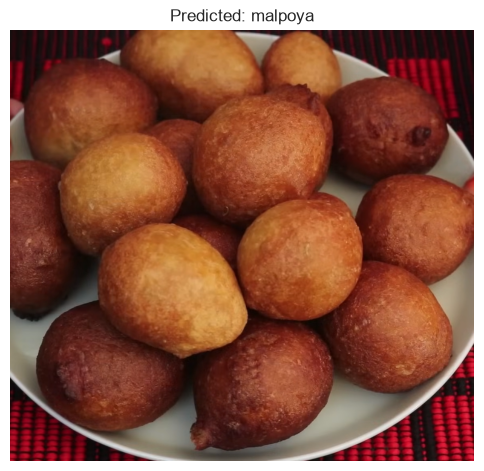

In [28]:
if run_inference:
    if QUERY_IMAGE_TRUE_LABEL is None or QUERY_IMAGE_TRUE_LABEL == pred_label:
        # a single panel: the query image with its prediction
        fig, ax = plt.subplots(figsize=(5, 5))
        ax.imshow(query_img)
        ax.axis('off')
        if QUERY_IMAGE_TRUE_LABEL is None:
            ax.set_title(f'Predicted: {pred_label}', fontsize=12)
        else:
            ax.set_title(f'Correct prediction: {pred_label}', fontsize=12, color='green')
    else:
        # misclassified: query image beside a reference image of the true class and of the predicted class
        true_ref_path = sample_image_for_class(QUERY_IMAGE_TRUE_LABEL)
        pred_ref_path = sample_image_for_class(pred_label)

        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        axes[0].imshow(query_img)
        axes[0].set_title('Query image', fontsize=11)

        if true_ref_path is not None:
            axes[1].imshow(load_and_orient_image(true_ref_path))
            axes[1].set_title(f'True class:\n{QUERY_IMAGE_TRUE_LABEL}', fontsize=11, color='green')
        else:
            axes[1].text(0.5, 0.5, 'no reference\nimage found', ha='center', va='center')

        if pred_ref_path is not None:
            axes[2].imshow(load_and_orient_image(pred_ref_path))
            axes[2].set_title(f'Predicted class:\n{pred_label}', fontsize=11, color='crimson')
        else:
            axes[2].text(0.5, 0.5, 'no reference\nimage found', ha='center', va='center')

        for ax in axes:
            ax.axis('off')
        plt.suptitle('Misclassified image - visual comparison', fontsize=13)
        print(f'Predicted "{pred_label}", true class "{QUERY_IMAGE_TRUE_LABEL}" - misclassified.')

    plt.tight_layout()
    plt.savefig(FIG_DIR / 'inference_demo.png')
    plt.show()

## 12. Output Summary

### Model artifacts (`model_convnext/`)

| File | Contents |
|---|---|
| `pitha_pca_convnext.pkl` | Fitted PCA transform (training data only) |
| `pitha_features_convnext.npz` | PCA features, labels and filenames for the training, validation and test sets |
| `pitha_backbone_convnext.json` | Backbone name, raw feature dimension, PCA components, retained variance |
| `pitha_label_encoder.pkl` | Class name ↔ integer mapping shared by all classifiers |
| `pitha_model_convnext.pkl` | Selected classifier (joblib) |
| `pitha_model_convnext.info.json` | Name of the selected classifier with its validation and test metrics |

### Tables (`model_convnext/tables/`)

| File | Contents |
|---|---|
| `experimental_setup.csv`, `software_environment.csv` | Experiment configuration and software versions |
| `split_summary.csv`, `dataset_summary_by_class.csv` | Subset sizes and per-class image counts |
| `feature_matrix_shapes.csv`, `pca_explained_variance.csv` | Feature matrix dimensions and PCA variance per component |
| `classifier_comparison.csv` | Validation and test metrics and training time of all four classifiers |
| `cv_scores_per_fold.csv`, `cv_summary.csv` | Cross-validation accuracy per fold, and mean ± standard deviation |
| `consolidated_classifier_results.csv` | Validation, test and cross-validation results in one table |
| `overall_test_metrics.csv`, `per_class_metrics.csv` | Overall and per-class test metrics of the selected model |
| `confusion_matrix_counts.csv`, `per_class_roc_auc.csv` | Confusion matrix and per-class ROC-AUC |
| `misclassified_test_images.csv`, `top_confused_class_pairs.csv` | Every wrong prediction and the most frequent class confusions |
| `inference_result.csv`, `inference_top3.csv` | Result of the single-image inference demonstration |

### Figures (`model_convnext/figures/`)

| File | Contents |
|---|---|
| `class_distribution.png`, `sample_images_per_class.png`, `augmentation_examples.png` | Dataset overview and augmentation examples |
| `pca_cumulative_variance.png` | Cumulative explained variance of the PCA projection |
| `classifier_accuracy_comparison.png`, `cv_accuracy_boxplot.png` | Validation/test accuracy and cross-validation accuracy of all classifiers |
| `per_class_f1.png` | Per-class F1-score of the selected model |
| `confusion_matrix.png`, `confusion_matrix_normalized.png` | Confusion matrices (counts and row-normalized) |
| `roc_curves.png` | One-vs-rest ROC curves with the macro-average |
| `confidence_distribution.png` | Prediction confidence of correct and incorrect predictions |
| `misclassified_test_images_page*.png` | Gallery of all misclassified test images |
| `inference_demo.png` | Single-image inference demonstration |

### Reporting notes

- The **test accuracy** of the selected model is the headline generalization result. It was never consulted during model selection.
- The **validation accuracy** documents the selection criterion and should not be reported as a final result.
- The **cross-validation mean ± standard deviation** describes how stable each classifier is across different partitions of the training data. Differences between classifiers that are smaller than the fold-to-fold spread should not be interpreted as a real ranking.
- **Macro-averaged** metrics weight every class equally, whereas **weighted** metrics account for class frequency.

In [29]:
# List every file generated by this run, so the outputs can be checked before submission
print('Model artifacts  :', MODEL_DIR)
for f in sorted(MODEL_DIR.iterdir()):
    if f.is_file():
        print('   ', f.name)

print('\nTables           :', TABLE_DIR)
for f in sorted(TABLE_DIR.glob('*.csv')):
    print('   ', f.name)

print('\nFigures          :', FIG_DIR)
for f in sorted(FIG_DIR.glob('*.png')):
    print('   ', f.name)

Model artifacts  : D:\3-2\machine-learning-laboratory\project\model_convnext
    pitha_backbone_convnext.json
    pitha_features_convnext.npz
    pitha_label_encoder.pkl
    pitha_model_convnext.info.json
    pitha_model_convnext.pkl
    pitha_pca_convnext.pkl

Tables           : D:\3-2\machine-learning-laboratory\project\model_convnext\tables
    classifier_comparison.csv
    confusion_matrix_counts.csv
    consolidated_classifier_results.csv
    cv_scores_per_fold.csv
    cv_summary.csv
    dataset_summary_by_class.csv
    experimental_setup.csv
    feature_matrix_shapes.csv
    inference_result.csv
    inference_top3.csv
    misclassified_test_images.csv
    overall_test_metrics.csv
    pca_explained_variance.csv
    per_class_metrics.csv
    per_class_roc_auc.csv
    software_environment.csv
    split_summary.csv
    top_confused_class_pairs.csv

Figures          : D:\3-2\machine-learning-laboratory\project\model_convnext\figures
    augmentation_examples.png
    class_distribution